Read historical data from solcast to train baseline data. then use solcast current data and predict baseline to analyse.

In [6]:
import pandas as pd
import numpy as np
import pyodbc
import matplotlib.pyplot as plt
import seaborn as sns
import urllib
import warnings
import joblib
import os

warnings.filterwarnings('ignore')

from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sqlalchemy import create_engine

In [7]:
def compute_diff(series):
    series_diff = series.diff()
    return series_diff

def handle_outliers(series):
    threshold = np.nanquantile(series, 0.999)
    return series.where((series <= threshold) & (series >= 0), np.nan)

def adjust_year(x, target_year=2021):
    try:
        return x.replace(year=target_year)
    except ValueError:  # February 29th does not exist in a non-leap year
        return x.replace(year=target_year, day=28)

In [8]:
# Database details
server = '23.101.237.42'
database = 'leap'
username = 'sa'
password = 'NjOzAi^GpU!!'

# Create the connection URL for the SQLAlchemy engine
# Note: We use urllib.parse.quote_plus to ensure special characters in the password (or username) are correctly formatted
connection_url = f"mssql+pyodbc:///?odbc_connect=" + urllib.parse.quote_plus(
    f"DRIVER={{ODBC Driver 18 for SQL Server}};SERVER={server};DATABASE={database};UID={username};PWD={password};TrustServerCertificate=yes"
)

solcast historical data as for the baseline.
 solsite simulation db have solar company data


Load Historical data to learn models for each meter.

In [9]:
bun_sol_df = pd.read_csv('data/bundoora_solcast.csv')
bun_sol_df['campus'] = ['BUNDOORA'] * len(bun_sol_df)

wod_sol_df = pd.read_csv('data/wodonga_solcast.csv')
wod_sol_df['campus'] = ['WODONGA'] * len(bun_sol_df)

ben_sol_df = pd.read_csv('data/bendigo_solcast.csv')
ben_sol_df['campus'] = ['BENDIGO'] * len(bun_sol_df)

mil_sol_df = pd.read_csv('data/mildura_solcast.csv')
mil_sol_df['campus'] = ['MILDURA'] * len(bun_sol_df)

she_sol_df = pd.read_csv('data/shepparton_solcast.csv')
she_sol_df['campus'] = ['SHEPPARTON'] * len(bun_sol_df)

solcast_hist_df = pd.concat([bun_sol_df, wod_sol_df, ben_sol_df, mil_sol_df, she_sol_df])
solcast_hist_df['timestamp'] = pd.to_datetime(solcast_hist_df['period_end']).dt.strftime('%Y-%m-%d %H:%M:%S')
solcast_hist_df['timestamp'] = pd.to_datetime(solcast_hist_df['timestamp'])
solcast_hist_df.drop(columns=['clearsky_dhi', 'clearsky_dni', 'clearsky_ghi', 'period', 'period_end'], inplace=True)


Load new data that are not included in above files.

In [10]:
from azure.storage.blob import BlobServiceClient
from io import StringIO

sas_token = "UmQIm94uLMGZkl8vOie0B1omByZBzJmP6tNodMe9HVHlgWAgprw2OX62wXCZqmJ4jAH04IBlfM5xNukhc3x9rQ=="
container_name = "solar-forecasts-solcast"

blob_service_client = BlobServiceClient(account_url="https://leapdata.blob.core.windows.net", credential=sas_token)
container_client = blob_service_client.get_container_client(container_name)

csv_files = [blob.name for blob in container_client.list_blobs() if "live" in blob.name and blob.name.endswith(".csv")]

dataframes = []
for file in csv_files:
    blob_client = container_client.get_blob_client(file)
    csv_data = blob_client.download_blob().content_as_text()
    temp_df = pd.read_csv(StringIO(csv_data))
    temp_df['source_file'] = file  # Add source file column to track file origins
    dataframes.append(temp_df)

solcast_live_df = pd.concat(dataframes)
solcast_live_df['accessed_on'] = pd.to_datetime(solcast_live_df['accessed_on'])
solcast_live_df['timestamp'] = pd.to_datetime(solcast_live_df['timestamp'])
solcast_live_df = solcast_live_df.sort_values(by='accessed_on').drop_duplicates(subset=['timestamp', 'campus'], keep='last')
# solcast_live_df = solcast_live_df.sort_values(by='timestamp')
solcast_live_df = solcast_live_df[solcast_live_df['timestamp'] > '2024-07-13 00:00:00']   # university wise .csv files have only data until july 13
solcast_live_df = solcast_live_df.sort_values(by='timestamp')
solcast_live_df.drop(columns=['accessed_on', 'source_file', 'timestamp_utc'], inplace=True)



In [11]:
solcast_live_df
solcast_df = pd.concat([solcast_hist_df, solcast_live_df])


solcast_df.to_csv("data/solcast_real.csv")

solcast_forecast_df = solcast_df[solcast_df['timestamp'] > '2025-01-01 00:00:00'] 

In [12]:
# from azure.storage.blob import BlobServiceClient
# from io import StringIO

# sas_token = "UmQIm94uLMGZkl8vOie0B1omByZBzJmP6tNodMe9HVHlgWAgprw2OX62wXCZqmJ4jAH04IBlfM5xNukhc3x9rQ=="
# container_name = "solar-forecasts-solcast"

# blob_service_client = BlobServiceClient(account_url="https://leapdata.blob.core.windows.net", credential=sas_token)
# container_client = blob_service_client.get_container_client(container_name)

# csv_files = [blob.name for blob in container_client.list_blobs() if "forecast" in blob.name and blob.name.endswith(".csv")]

# dataframes = []
# for file in csv_files:
#     blob_client = container_client.get_blob_client(file)
#     csv_data = blob_client.download_blob().content_as_text()
#     temp_df = pd.read_csv(StringIO(csv_data))
#     temp_df['source_file'] = file  # Add source file column to track file origins
#     dataframes.append(temp_df)

# solcast_forecast_df = pd.concat(dataframes)
# solcast_forecast_df['accessed_on'] = pd.to_datetime(solcast_forecast_df['accessed_on'])
# solcast_forecast_df['timestamp'] = pd.to_datetime(solcast_forecast_df['timestamp'])
# solcast_forecast_df = solcast_forecast_df.sort_values(by='accessed_on').drop_duplicates(subset=['timestamp', 'campus'], keep='last')
# # solcast_live_df = solcast_live_df.sort_values(by='timestamp')
# solcast_forecast_df = solcast_forecast_df[solcast_forecast_df['timestamp'] > '2025-08-15 00:00:00']   # university wise .csv files have only data until july 13
# solcast_forecast_df = solcast_forecast_df.sort_values(by='timestamp')
# solcast_forecast_df.drop(columns=['accessed_on', 'source_file', 'timestamp_utc'], inplace=True)

In [13]:
pd.unique(solcast_forecast_df['campus'])

array(['BUNDOORA', 'SHEPPARTON', 'WODONGA', 'BENDIGO', 'MILDURA'],
      dtype=object)

Merge hist data and live data into one file

In [14]:
solcast_forecast_df    # weather data of all the area by each 30 minutes, from 2021 to present
# solcast_live_df.to_csv('data/model_accuracy.csv', index=False)
solcast_forecast_df.to_csv("data/solcast_pred.csv")

Get All meter names

In [15]:
# Create an SQLAlchemy engine
engine = create_engine(connection_url)

# Use the engine to execute a query and load the result set into a DataFrame
query = "SELECT DISTINCT meter FROM [Leap].[dbo].[SolarSiteSimulation]"
meters_df = pd.read_sql_query(query, engine)
meters = meters_df['meter'].to_list()

# Close the engine connection
engine.dispose()

In [16]:
# meters = list(set(meters_df['meter']))

campuses = []
for meter in meters:
    if('bun' in meter): campuses.append('BUNDOORA')
    elif('albury' in meter): campuses.append('WODONGA')
    elif('bendigo' in meter): campuses.append('BENDIGO')
    elif('mildura' in meter): campuses.append('MILDURA')
    elif('shepparton' in meter): campuses.append('SHEPPARTON')

Read power generation data from Solar site simulator table. Then train models for weather data and power generation.

In [17]:
acc_df = pd.read_csv('data/model_accuracy.csv')

## Training XGBoost models   -  Simulated model

In [18]:
# Create an SQLAlchemy engine
engine = create_engine(connection_url)
    
first = True
print("meter, old, new")
for i in range(len(meters)):
    meter = meters[i]
    campus = campuses[i]
    # print(f"Processing {meter}")
    meter_weather_df = solcast_df[solcast_df['campus'] == campus][['air_temp','cloud_opacity','relative_humidity','dewpoint_temp','wind_speed_10m','zenith', 'timestamp']]

    # try:
    # Use the engine to execute a query and load the result set into a DataFrame
    query = f"SELECT *, [grid_power] / 1000 AS grid_power_kWh FROM [Leap].[dbo].[SolarSiteSimulation] WHERE meter = '{meter}' ORDER BY timestamp"
    sim_df = pd.read_sql_query(query, engine)
    # print(sim_df)
    sim_df = pd.merge(sim_df, meter_weather_df, on='timestamp', how='left')

    # Select features and target variable
    features = ['global_horizontal_irradiance','air_temp','cloud_opacity','relative_humidity','dewpoint_temp','wind_speed_10m','zenith']
    target = 'grid_power_kWh'

    # Prepare the data
    X = sim_df[features].astype(float)
    y = sim_df[target].astype(float)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize and train the XGBoost regressor
    xgb_model_old = XGBRegressor(objective='reg:squarederror', n_estimators=100)
    xgb_model_old.fit(X_train, y_train)

    # Predictions
    xgb_predictions_old = xgb_model_old.predict(X_test)
    # Evaluate the models___
    xgb_rmse_old = np.sqrt(mean_squared_error(y_test, xgb_predictions_old))

    xgb_model = XGBRegressor(
        objective="reg:squarederror",
        learning_rate=0.1,          # smaller + more trees + early stop
        n_estimators=100,           # let early stopping pick best
        max_depth=8,                 # PV tends to like 4-8
        min_child_weight=0,
        subsample=0.7,               # row subsample
        colsample_bytree=1,        # feature subsample
        reg_alpha=2.6699,               # L1 (tune if overfit)
        reg_lambda=2.91,               # L2
        random_state=0,
    )

    xgb_model.fit(X_train, y_train)

    # Predictions
    xgb_predictions = xgb_model.predict(X_test)
    # Evaluate the models___
    xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_predictions))
    xgb_mae = mean_absolute_error(y_test, xgb_predictions)

    print(f'{meter},{xgb_rmse_old},{xgb_rmse}')


    model_name = meter + '.pkl'
    filepath = os.path.join('models/simulated', model_name)
    joblib.dump(xgb_model, filepath)

    # Update accuracy csv
    acc_df.loc[acc_df['Meter']==meter, 'NEW RMSE'] = xgb_rmse
    acc_df.loc[acc_df['Meter']==meter, 'NEW MAE'] = xgb_mae

    print("")
# Close the engine connection
engine.dispose()
acc_df.to_csv('data/model_accuracy.csv', index=False)

meter, old, new
solar.bun_bg#realenergyintotheload#kwh,0.5810684118578988,0.5593124312064804

solar.bun_carm1#realenergyintotheload#kwh,0.702478179386906,0.6540190197269469

solar.bun_carm2#realenergyintotheload#kwh,1.799719482412079,1.7656865295063604

solar.bun_cs1#realenergyintotheload#kwh,0.7086917727258969,0.6891954328591234

solar.bun_dmw#realenergyintotheload#kwh,2.3438313725098463,2.3063036977617224

solar.bun_dw#realenergyintotheload#kwh,0.3379277373728184,0.3289297608253338

solar.bun_hs1#realenergyintotheload#kwh,1.0224438573963015,0.98176887077785

solar.bun_hs2#realenergyintotheload#kwh,0.4836771278320141,0.45976816632684003

solar.bun_hs3#realenergyintotheload#kwh,0.888518521325435,0.890367989083863

solar.bun_hsc#realenergyintotheload#kwh,0.9190160292549675,0.9321479930952514

solar.bun_hu3#realenergyintotheload#kwh,0.7511492075856568,0.7286033465287663

solar.bun_library#realenergyintotheload#kwh,4.623729005864618,4.442396053154023

solar.bun_lims1#realenergyintotheload

## Load Real 1 hour data

In [19]:
old_final_df = pd.read_csv("data/SolarMeterReadings1hour.csv")
last_date = list(old_final_df['timestamp'])[-1]

print(last_date)

2025-11-24 02:00:00


In [20]:
# meters = meters[:1]
print(meters)

['solar.bun_bg#realenergyintotheload#kwh', 'solar.bun_carm1#realenergyintotheload#kwh', 'solar.bun_carm2#realenergyintotheload#kwh', 'solar.bun_cs1#realenergyintotheload#kwh', 'solar.bun_dmw#realenergyintotheload#kwh', 'solar.bun_dw#realenergyintotheload#kwh', 'solar.bun_hs1#realenergyintotheload#kwh', 'solar.bun_hs2#realenergyintotheload#kwh', 'solar.bun_hs3#realenergyintotheload#kwh', 'solar.bun_hsc#realenergyintotheload#kwh', 'solar.bun_hu3#realenergyintotheload#kwh', 'solar.bun_library#realenergyintotheload#kwh', 'solar.bun_lims1#realenergyintotheload#kwh', 'solar.bun_ltss_pv_lgcmeter#realenergyintotheload#kwh', 'solar.bun_lwso#realenergyintotheload#kwh', 'solar.bun_mb#realenergyintotheload#kwh', 'solar.bun_mc#realenergyintotheload#kwh', 'solar.bun_pe#realenergyintotheload#kwh', 'solar.bun_ps2#realenergyintotheload#kwh', 'solar.bun_pw#realenergyintotheload#kwh', 'solar.bun_rd1#realenergyintotheload#kwh', 'solar.bun_rd2#realenergyintotheload#kwh', 'solar.bun_rlr#realenergyintotheloa

## Load Meter readings from database - craete hourly data file for each meter

In [ ]:
'''engine = create_engine(connection_url)

dfs = []  
for meter in meters:
    print(f"Processing {meter}")
    
    try:
        # query = f"SELECT * FROM [SolarMeterReadings] WHERE [MeterKeyString] = '{meter}' AND [ReadingTimestamp] > '{last_date}'  ORDER BY ReadingTimestamp"
        query = f"SELECT * FROM [SolarMeterReadings] WHERE [MeterKeyString] = '{meter}'  ORDER BY ReadingTimestamp"
        df = pd.read_sql_query(query, engine)
        df.drop_duplicates(subset=['ReadingTimestamp'], inplace=True)
        df['MeterReading'] = df['MeterReading'].interpolate()
        df['Difference'] = df['MeterReading'].transform(compute_diff)
        df['meter_reading'] = df['Difference'].transform(handle_outliers)
        df['meter_reading'].interpolate(method='linear', inplace=True)
        # df['data_out'] = np.where(df['meter_reading'].isnull(), 1, 0)
        df['timestamp'] = pd.to_datetime(df['ReadingTimestamp'])

        df.set_index('timestamp', inplace=True)
        df = df.resample('1H').agg({'meter_reading': 'sum'})
        df.reset_index(inplace=True)
        
        df['meter'] = [meter] * len(df)
        dfs.append(df)
    except:
        print(f"{meter} failed")
# Close the engine connection

final_df = pd.concat(dfs)
final_df = pd.concat([old_final_df, final_df])
final_df.to_csv('data/SolarMeterReadings1hour.csv', index=False)
engine.dispose()'''

Processing solar.bun_bg#realenergyintotheload#kwh
Processing solar.bun_carm1#realenergyintotheload#kwh
Processing solar.bun_carm2#realenergyintotheload#kwh
Processing solar.bun_cs1#realenergyintotheload#kwh
Processing solar.bun_dmw#realenergyintotheload#kwh
Processing solar.bun_dw#realenergyintotheload#kwh
Processing solar.bun_hs1#realenergyintotheload#kwh
Processing solar.bun_hs2#realenergyintotheload#kwh
Processing solar.bun_hs3#realenergyintotheload#kwh
solar.bun_hs3#realenergyintotheload#kwh failed
Processing solar.bun_hsc#realenergyintotheload#kwh
Processing solar.bun_hu3#realenergyintotheload#kwh
Processing solar.bun_library#realenergyintotheload#kwh
Processing solar.bun_lims1#realenergyintotheload#kwh
Processing solar.bun_ltss_pv_lgcmeter#realenergyintotheload#kwh
Processing solar.bun_lwso#realenergyintotheload#kwh
Processing solar.bun_mb#realenergyintotheload#kwh
Processing solar.bun_mc#realenergyintotheload#kwh
Processing solar.bun_pe#realenergyintotheload#kwh
solar.bun_pe#rea

# Chatgpt recorrected data 

In [21]:
engine = create_engine(connection_url)

dfs = []
for meter in meters:
    print(f"Processing {meter}")
    try:
        query = (
            f"SELECT MeterReadingId, ReadingTimestamp, CampusKeyString, "
            f"MeterKeyString, MeterReading "
            f"FROM [SolarMeterReadings] WHERE [MeterKeyString] = '{meter}' "
            f"ORDER BY ReadingTimestamp"
        )
        df = pd.read_sql_query(query, engine)

        # --- minimal fixes ---
        df["ReadingTimestamp"] = pd.to_datetime(df["ReadingTimestamp"], errors="coerce")
        df = df.dropna(subset=["ReadingTimestamp"]).sort_values("ReadingTimestamp")
        df = df.drop_duplicates(subset=["ReadingTimestamp"], keep="first")

        # keep numeric
        df["MeterReading"] = pd.to_numeric(df["MeterReading"], errors="coerce")

        # interpolate the CUMULATIVE only (before diff)
        df["MeterReading"] = df["MeterReading"].interpolate(limit_direction="both")

        # your helpers on the cumulative (or replace with plain diff if you want)
        df["Difference"] = df["MeterReading"].transform(compute_diff)
        df["meter_reading"] = df["Difference"].transform(handle_outliers)

        # DO NOT interpolate energy after diff (it fabricates kWh)
        # df["meter_reading"].interpolate(method="linear", inplace=True)  # ← remove

        df = df.set_index("ReadingTimestamp")
        # clear hourly semantics: bin (00:00–01:00] is labeled at 01:00
        df = df.resample("1H", label="right", closed="right").agg({"meter_reading": "sum"})
        df = df.reset_index().rename(columns={"ReadingTimestamp": "timestamp"})

        df["meter"] = meter
        dfs.append(df)
    except Exception as e:
        print(f"{meter} failed: {e}")

# Close the engine connection
engine.dispose()

final_df = pd.concat(dfs, ignore_index=True)

# merge with old and dedupe (keep latest)
final_df = pd.concat([old_final_df, final_df], ignore_index=True)
final_df["timestamp"] = pd.to_datetime(final_df["timestamp"], errors="coerce")
final_df = (
    final_df.dropna(subset=["timestamp"])
            .sort_values(["meter", "timestamp"])
            .drop_duplicates(subset=["meter", "timestamp"], keep="last")
)

final_df.to_csv("data/SolarMeterReadings1hour.csv", index=False)
print("Wrote data/SolarMeterReadings1hour.csv")


Processing solar.bun_bg#realenergyintotheload#kwh
Processing solar.bun_carm1#realenergyintotheload#kwh
Processing solar.bun_carm2#realenergyintotheload#kwh
Processing solar.bun_cs1#realenergyintotheload#kwh
Processing solar.bun_dmw#realenergyintotheload#kwh
Processing solar.bun_dw#realenergyintotheload#kwh
Processing solar.bun_hs1#realenergyintotheload#kwh
Processing solar.bun_hs2#realenergyintotheload#kwh
Processing solar.bun_hs3#realenergyintotheload#kwh
Processing solar.bun_hsc#realenergyintotheload#kwh
Processing solar.bun_hu3#realenergyintotheload#kwh
Processing solar.bun_library#realenergyintotheload#kwh
Processing solar.bun_lims1#realenergyintotheload#kwh
Processing solar.bun_ltss_pv_lgcmeter#realenergyintotheload#kwh
Processing solar.bun_lwso#realenergyintotheload#kwh
Processing solar.bun_mb#realenergyintotheload#kwh
Processing solar.bun_mc#realenergyintotheload#kwh
Processing solar.bun_pe#realenergyintotheload#kwh
Processing solar.bun_ps2#realenergyintotheload#kwh
Processing s

PermissionError: [Errno 13] Permission denied: 'data/SolarMeterReadings1hour.csv'

## Train Reasl XGBoost models - preprocess

In [24]:
final_df.head(10)
print(len(final_df))

1443200


In [25]:
def get_campus(meter_name: str) -> str:
    name = meter_name.lower()
    if "bun" in name:
        return "BUNDOORA"
    elif "albury" in name:
        return "WODONGA"
    elif "bendigo" in name:
        return "BENDIGO"
    elif "mildura" in name:
        return "MILDURA"
    elif "shepparton" in name:
        return "SHEPPARTON"
    else:
        return "UNKNOWN"


final_df["campus"] = final_df["meter"].apply(get_campus)

# print(final_df.iloc[500000])

solcast_df['global_horizontal_irradiance'] = solcast_df['ghi']
solcast_forecast_df['global_horizontal_irradiance'] = solcast_forecast_df['ghi']
final_df['grid_power_kWh'] = final_df['meter_reading']
# final_df["timestamp"]     = pd.to_datetime(final_df["timestamp"], errors="coerce", utc=True)\
#                              .dt.tz_convert("UTC").dt.tz_localize(None)
# solcast_df["timestamp"] = pd.to_datetime(solcast_df["timestamp"], errors="coerce", utc=True)\
#                              .dt.tz_convert("UTC").dt.tz_localize(None)


final_df['timestamp'] = pd.to_datetime(final_df['timestamp'])

solcast_df['timestamp'] = pd.to_datetime(solcast_df['timestamp'])

In [26]:
meters = list(pd.unique(final_df["meter"]))
# campuses = list(pd.unique(final_df["campus"]))
# meters = ['solar.bun_bg#realenergyintotheload#kwh']

## Filter proper days for training

In [28]:
import pandas as pd
import numpy as np


def make_xgb_training_perfect_days(
    df,
    ts_col="timestamp",
    meter_col="meter",
    value_col="grid_power_kWh",
    night_hours=(0,1,2,3,4,5,21,22,23),
    min_day_active_hours=6,
    night_rel=0.02,
    night_abs=0.05,
    day_rel=0.05,
    day_abs=0.10,
    spike_mult=3.0,
    require_exact_full_day=False,   # <- softened
    coverage_tolerance=0.7,         # <- softened
):
    if df.empty:
        return df

    out = df.copy()
    out[ts_col] = pd.to_datetime(out[ts_col], errors="coerce")
    out = out.dropna(subset=[ts_col]).sort_values(ts_col)

    # Remove accidental index column if present
    if "Unnamed: 0" in out.columns:
        out = out.drop(columns=["Unnamed: 0"])

    # --- IMPORTANT: keep one row per (timestamp, meter)
    if meter_col in out.columns:
        out = out.drop_duplicates(subset=[ts_col, meter_col])
    else:
        out = out.drop_duplicates(subset=[ts_col])

    # numeric value
    out[value_col] = pd.to_numeric(out[value_col], errors="coerce")

    # Derived cols
    out["__date"] = out[ts_col].dt.date
    out["__hour"] = out[ts_col].dt.hour

    # Helper: compute thresholds per meter from its own distribution
    def meter_thresholds(g):
        pos = g.loc[g[value_col] > 0, value_col]
        p95 = float(pos.quantile(0.95)) if len(pos) else 0.0
        p99 = float(pos.quantile(0.99)) if len(pos) else 0.0
        return p95, p99

    keep_index = []

    # Group by meter first (or a single group if meter_col missing)
    meter_groups = [ (None, out) ] if meter_col not in out.columns else out.groupby(meter_col, sort=False)

    for m_key, g_meter in meter_groups:
        # Per-meter cadence/coverage: use median count per day (robust to DST/irregular)
        per_day_counts = g_meter.groupby(g_meter[ts_col].dt.date).size()
        if per_day_counts.empty:
            continue
        expected_per_day = int(per_day_counts.median())  # robust baseline
        min_required = int(np.floor(expected_per_day * coverage_tolerance)) if expected_per_day > 0 else 1

        p95, p99 = meter_thresholds(g_meter)
        night_thresh = max(night_abs, night_rel * p95)
        day_thresh   = max(day_abs,  day_rel  * p95)
        spike_cap    = (p99 * spike_mult) if p99 > 0 else float("inf")

        def day_ok(g_day):
            v = g_day[value_col].to_numpy(dtype=float)
            h = g_day["__hour"].to_numpy(dtype=int)

            # coverage
            if require_exact_full_day:
                if len(g_day) < min_required:
                    return False
            else:
                # allow partial days but reject extremely sparse ones (<30% of expected)
                if expected_per_day > 0 and len(g_day) < max(1, int(0.3 * expected_per_day)):
                    return False

            # NaNs/negatives
            if np.isnan(v).any() or (v < 0).any():
                return False

            # Night quiet (tolerant)
            night_vals = v[np.isin(h, night_hours)]
            if night_vals.size and np.nanmax(night_vals) > night_thresh:
                # allow one-off tiny leak by using 95th percentile
                if np.nanpercentile(night_vals, 95) > night_thresh:
                    return False

            # Day activity
            day_mask = ~np.isin(h, night_hours)
            if not day_mask.any():
                return False
            g2 = pd.DataFrame({"hour": h[day_mask], "val": v[day_mask]})
            active_hours = (g2.groupby("hour")["val"].max() > day_thresh).sum()
            if active_hours < min_day_active_hours:
                return False

            # Spikes: clip instead of dropping the day completely
            if np.nanmax(v) > spike_cap:
                g_day[value_col] = np.minimum(g_day[value_col], spike_cap)

            return True

        # apply per date within this meter
        for d, g_day in g_meter.groupby(g_meter[ts_col].dt.date, sort=False):
            if day_ok(g_day.copy()):
                keep_index.append(g_day.index)

    if not keep_index:
        # If nothing passed, fall back to returning the cleaned but unfiltered data
        return out.drop(columns=["__date","__hour"])

    keep_index = np.concatenate(keep_index)
    filtered = out.loc[keep_index].drop(columns=["__date","__hour"]).sort_values([meter_col, ts_col]) if meter_col in out.columns else out.loc[keep_index].drop(columns=["__date","__hour"]).sort_values(ts_col)
    return filtered


def uniq_weather(df_weather, ts_col="timestamp"):
    w = df_weather.copy()
    w[ts_col] = pd.to_datetime(w[ts_col], errors="coerce")
    w = w.dropna(subset=[ts_col]).sort_values(ts_col)
    # If weather has multiple observations at the same timestamp, average them instead of dropping
    return w.groupby(ts_col, as_index=False).mean(numeric_only=True)


def enforce_unique_timestamps(df, ts_col="timestamp", meter_col=None, agg="sum"):
    d = df.copy()
    d[ts_col] = pd.to_datetime(d[ts_col], errors="coerce")
    d = d.dropna(subset=[ts_col]).sort_values(ts_col)
    # Aggregate duplicates rather than drop (and keep meters separate)
    if meter_col and meter_col in d.columns:
        return (d.groupby([ts_col, meter_col], as_index=False)
                 .agg({col: agg if np.issubdtype(d[col].dtype, np.number) else "first" for col in d.columns if col not in [ts_col, meter_col]}))
    else:
        return (d.groupby(ts_col, as_index=False)
                 .agg({col: agg if np.issubdtype(d[col].dtype, np.number) else "first" for col in d.columns if col != ts_col}))


'''
def make_xgb_training_perfect_days(
    df,
    ts_col="timestamp",
    meter_col="meter",
    value_col="grid_power_kWh",
    night_hours=(0,1,2,3,4,5,21,22,23),
    min_day_active_hours=6,
    night_rel=0.02,
    night_abs=0.05,
    day_rel=0.05,
    day_abs=0.10,
    spike_mult=3.0,
    require_exact_full_day=True,
    coverage_tolerance=0.8,     # allow >=80% of expected samples
):
    if df.empty:
        return df

    out = df.copy()
    out[ts_col] = pd.to_datetime(out[ts_col], errors="coerce")
    out = out.dropna(subset=[ts_col]).sort_values(ts_col)

    # Remove accidental index column if present
    if "Unnamed: 0" in out.columns:
        out = out.drop(columns=["Unnamed: 0"])

    # DEDUPLICATE after merges (critical)
    out = out.drop_duplicates(subset=[ts_col])

    # numeric value
    out[value_col] = pd.to_numeric(out[value_col], errors="coerce")

    # Detect cadence robustly: use positive deltas only
    dt = out[ts_col].diff().dt.total_seconds().dropna()
    dt = dt[dt > 0] / 60.0  # minutes
    if dt.empty:
        freq_min = 60
    else:
        dt_rounded = dt.round().astype(int)
        # prefer mode; if multi-modal, fallback to median
        if dt_rounded.mode().empty:
            freq_min = int(np.median(dt_rounded))
        else:
            freq_min = int(dt_rounded.mode().iloc[0])
        if freq_min <= 0:
            freq_min = 60

    expected_per_day = int(round(24 * 60 / freq_min))
    min_required_per_day = int(np.floor(expected_per_day * coverage_tolerance))

    out["__date"] = out[ts_col].dt.date
    out["__hour"] = out[ts_col].dt.hour

    # Robust thresholds (percentile-based) + cadence scaling for energy-per-interval
    pos = out.loc[out[value_col] > 0, value_col]
    p95 = float(pos.quantile(0.95)) if len(pos) else 0.0
    p99 = float(pos.quantile(0.99)) if len(pos) else 0.0

    scale = max(freq_min / 60.0, 1e-6)  # 30 min -> 0.5, 15 min -> 0.25
    night_thresh = max(night_abs * scale, night_rel * p95)
    day_thresh   = max(day_abs   * scale, day_rel   * p95)
    spike_cap    = (p99 * spike_mult) if p99 > 0 else float("inf")

    def is_perfect_day(g):
        v = g[value_col].values
        h = g["__hour"].values

        # coverage with tolerance or strict
        if require_exact_full_day:
            if len(g) < min_required_per_day:
                return False

        # No NaNs/negatives
        if np.isnan(v).any() or (v < 0).any():
            return False

        # Night quiet
        night_vals = v[np.isin(h, night_hours)]
        if night_vals.size and not np.all(night_vals <= night_thresh):
            return False

        # Day activity: count per-hour maxima above threshold
        day_mask = ~np.isin(h, night_hours)
        if not day_mask.any():
            return False
        g2 = pd.DataFrame({"hour": h[day_mask], "val": v[day_mask]})
        active_hours = g2.groupby("hour")["val"].max() > day_thresh
        if active_hours.sum() < min_day_active_hours:
            return False

        # No extreme spikes
        if np.nanmax(v) > spike_cap:
            return False

        return True

    flags = out.groupby("__date", sort=False).apply(is_perfect_day).rename("ok").reset_index()
    keep_dates = set(flags.loc[flags["ok"], "__date"])

    filtered = out[out["__date"].isin(keep_dates)].drop(columns=["__date","__hour"])
    return filtered


def uniq_weather(df_weather, ts_col="timestamp"):
    w = df_weather.copy()
    w[ts_col] = pd.to_datetime(w[ts_col], errors="coerce")
    w = w.dropna(subset=[ts_col]).sort_values(ts_col)
    # Pick one row per timestamp (or change to groupby().mean() if you truly have multiples)
    w = w.drop_duplicates(subset=[ts_col], keep="first")
    return w

def enforce_unique_timestamps(df, ts_col="timestamp"):
    d = df.copy()
    d[ts_col] = pd.to_datetime(d[ts_col], errors="coerce")
    d = d.dropna(subset=[ts_col]).sort_values(ts_col)
    # remove duplicated timestamps created by one-to-many merges
    d = d.drop_duplicates(subset=[ts_col], keep="first")
    return d'''

'\ndef make_xgb_training_perfect_days(\n    df,\n    ts_col="timestamp",\n    meter_col="meter",\n    value_col="grid_power_kWh",\n    night_hours=(0,1,2,3,4,5,21,22,23),\n    min_day_active_hours=6,\n    night_rel=0.02,\n    night_abs=0.05,\n    day_rel=0.05,\n    day_abs=0.10,\n    spike_mult=3.0,\n    require_exact_full_day=True,\n    coverage_tolerance=0.8,     # allow >=80% of expected samples\n):\n    if df.empty:\n        return df\n\n    out = df.copy()\n    out[ts_col] = pd.to_datetime(out[ts_col], errors="coerce")\n    out = out.dropna(subset=[ts_col]).sort_values(ts_col)\n\n    # Remove accidental index column if present\n    if "Unnamed: 0" in out.columns:\n        out = out.drop(columns=["Unnamed: 0"])\n\n    # DEDUPLICATE after merges (critical)\n    out = out.drop_duplicates(subset=[ts_col])\n\n    # numeric value\n    out[value_col] = pd.to_numeric(out[value_col], errors="coerce")\n\n    # Detect cadence robustly: use positive deltas only\n    dt = out[ts_col].diff().dt

# Train real models

In [37]:
import os
import numpy as np
import pandas as pd
from sqlalchemy import create_engine
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor
import joblib

# ---- helpers ----
def uniq_weather(df_weather, ts_col="timestamp"):
    """Make weather unique per timestamp (keep first)."""
    w = df_weather.copy()
    w[ts_col] = pd.to_datetime(w[ts_col], errors="coerce")
    w = w.dropna(subset=[ts_col]).sort_values(ts_col)
    return w.drop_duplicates(subset=[ts_col], keep="first")

def enforce_unique_timestamps(df, ts_col="timestamp"):
    """Ensure one row per timestamp after merges."""
    d = df.copy()
    d[ts_col] = pd.to_datetime(d[ts_col], errors="coerce")
    d = d.dropna(subset=[ts_col]).sort_values(ts_col)
    return d.drop_duplicates(subset=[ts_col], keep="first")

# ------------------ CONFIG ------------------
features = [
    "global_horizontal_irradiance",
    "air_temp",
    "cloud_opacity",
    "relative_humidity",
    "dewpoint_temp",
    "wind_speed_10m",
    "zenith",
]
target = "grid_power_kWh"
model_dir = "models/real_h"
os.makedirs(model_dir, exist_ok=True)

# ------------------ ENGINE ------------------
engine = create_engine(connection_url)

# ------------------ LOOP ------------------
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

print("Meter, RMSE")

for i in range(len(meters)):
    meter = meters[i]

    # --- select actuals for this meter from final_df (already prepared by you) ---
    sim_df = final_df[final_df["meter"] == meter].copy()
    sim_df["timestamp"] = pd.to_datetime(sim_df["timestamp"], errors="coerce")
    sim_df = sim_df.dropna(subset=["timestamp"])

    # --- campus & weather ---
    campus = get_campus(meter)
    # print(f"\n[REAL] Processing {meter}  |  campus={campus}")

    meter_weather_df = uniq_weather(
        solcast_df.loc[solcast_df["campus"] == campus,
                       ["global_horizontal_irradiance","air_temp","cloud_opacity",
                        "relative_humidity","dewpoint_temp","wind_speed_10m","zenith","timestamp"]]
    )

    # --- merge & clean ---
    sim_df = pd.merge(sim_df, meter_weather_df, on="timestamp", how="left")
    sim_df = enforce_unique_timestamps(sim_df, "timestamp")
    sim_df = sim_df.dropna(subset=[target])            # keep rows with actuals
    # optionally: keep only rows with some irradiation to reduce pure-night noise
    # sim_df = sim_df[sim_df["global_horizontal_irradiance"].fillna(0) > 0]

    # --- optional perfect-day filter (your function) ---
    # If this makes the set empty, relax coverage or skip it.
    sim_df = make_xgb_training_perfect_days(
        sim_df,
        ts_col="timestamp",
        meter_col="meter",
        value_col="grid_power_kWh",
        require_exact_full_day=True,
        coverage_tolerance=0.8
    )
    # print("after perfect-day filter:", len(sim_df))

    # If filtering was too strict, bail out gracefully
    if len(sim_df) < 200:
        print(f"  Skipping {meter}: not enough data after filtering ({len(sim_df)} rows).")
        continue

    # --- final feature/target cleanup ---
    sim_df = sim_df.sort_values("timestamp")
    for c in [target] + features:
        sim_df[c] = pd.to_numeric(sim_df[c], errors="coerce")
    sim_df = sim_df.dropna(subset=[target] + features)
    sim_df = enforce_unique_timestamps(sim_df, "timestamp")

    if len(sim_df) < 200:
        print(f"  Skipping {meter}: not enough clean rows ({len(sim_df)}).")
        continue

    # --- chronological split (avoid leakage) ---
    n = len(sim_df)
    split = int(n * 0.95)   # your code used test_size=0.05
    train_part = sim_df.iloc[:split]
    test_part  = sim_df.iloc[split:]

    X_train = train_part[features].astype(float)
    y_train = train_part[target].astype(float)
    X_test  = test_part[features].astype(float)
    y_test  = test_part[target].astype(float)
    # Initialize and train the XGBoost regressor

    # Old model
    xgb_model_old = XGBRegressor(objective='reg:squarederror', n_estimators=100)

    
    xgb_model_old.fit(X_train.iloc[-8000:-4000], y_train.iloc[-8000:-4000])

    # Predictions
    xgb_predictions_old = xgb_model_old.predict(X_test)

    
    xgb_rmse_old = np.sqrt(mean_squared_error(y_test, xgb_predictions_old))

    # New Model
    xgb_model = XGBRegressor(
        objective="reg:squarederror",
        learning_rate=0.1,          # smaller + more trees + early stop
        n_estimators=100,           # let early stopping pick best
        max_depth=8,                 # PV tends to like 4-8
        min_child_weight=0,
        subsample=0.7,               # row subsample
        colsample_bytree=1,        # feature subsample
        reg_alpha=2.6699,               # L1 (tune if overfit)
        reg_lambda=2.91,               # L2
        random_state=0,
    )

    xgb_model.fit(X_train.iloc[-8000:-4000], y_train.iloc[-8000:-4000])

    # Predictions
    xgb_predictions = xgb_model.predict(X_test)

    # Evaluate the models___
    xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_predictions))
    xgb_mae = mean_absolute_error(y_test, xgb_predictions)

    print(f'{meter},{xgb_rmse_old}, {xgb_rmse}')

    model_name = meter + '.pkl'
    filepath = os.path.join('models/real_h', model_name)
    joblib.dump(xgb_model, filepath)

    # Update accuracy csv
    acc_df.loc[acc_df['Meter']==meter, 'NEW RMSE'] = xgb_rmse
    acc_df.loc[acc_df['Meter']==meter, 'NEW MAE'] = xgb_mae

    # print("")
# Close the engine connection
engine.dispose()
# acc_df.to_csv('data/model_accuracy.csv', index=False)

Meter, RMSE
solar.bun_bg#realenergyintotheload#kwh,3.3029692289849097, 3.0539584668404762
solar.bun_carm1#realenergyintotheload#kwh,3.408117820298668, 3.189968764168039
solar.bun_carm2#realenergyintotheload#kwh,6.406710576211946, 6.159266019928984
solar.bun_cs1#realenergyintotheload#kwh,2.2609932973144287, 2.1361739087814318
solar.bun_dmw#realenergyintotheload#kwh,15.457272010147113, 13.46718146751764
solar.bun_dw#realenergyintotheload#kwh,10.871740565768546, 9.708789337224333
solar.bun_hs1#realenergyintotheload#kwh,4.417672902101722, 4.181774368059886
solar.bun_hs2#realenergyintotheload#kwh,1.9473613116382054, 1.7092470532213004
solar.bun_hs3#realenergyintotheload#kwh,3.340628381730403, 2.9332124071743477
solar.bun_hsc#realenergyintotheload#kwh,2.7700013608725214, 2.7094681696907705
solar.bun_hu3#realenergyintotheload#kwh,17.178420183597563, 16.110287457654543
solar.bun_library#realenergyintotheload#kwh,39.19524400528706, 36.91301714123122
solar.bun_lims1#realenergyintotheload#kwh,1.8

# Prediction

In [32]:
available_forecast = list(pd.unique(solcast_forecast_df["campus"]))
print(available_forecast)
solcast_forecast_df['global_horizontal_irradiance'] = solcast_forecast_df['ghi']

['BUNDOORA', 'SHEPPARTON', 'WODONGA', 'BENDIGO', 'MILDURA']


In [33]:
import os

folder_path = "models/simulated"

# List all items in the folder
simulted_meters = [x[:-4] for x in os.listdir(folder_path)]

folder_path = "models/real_h"

# List all items in the folder
real_meters = [x[:-4] for x in os.listdir(folder_path)]
common = list(set(simulted_meters) & set(real_meters))



crystalline-silicon panels typically lose about 0.4–0.8% of output per year.
If your panels degrade ~0.5%/yr: output ≈ 97.5% of original (≈ 2.5% loss).
Many warranties assume a bigger first-year drop (e.g., ~2–3%) then ~0.4–0.7%/yr afterward, which lands around ~4–5% total loss by year 5

In [34]:
solcast_forecast_df.head(10)

,air_temp,albedo,azimuth,cloud_opacity,dewpoint_temp,dhi,dni,ghi,precipitable_water,precipitation_rate,relative_humidity,surface_pressure,snow_depth,snow_water_equivalent,snow_soiling_rooftop,snow_soiling_ground,wind_direction_100m,wind_direction_10m,wind_speed_100m,wind_speed_10m,zenith,campus,timestamp,global_horizontal_irradiance
333,15,0.15,163,1.0,11.3,0,0,0,21.2,0.0,77.7,1025.8,0.0,0,0,0,167,168,4.5,2.3,117,BUNDOORA,2025-01-01 00:30:00,0
1678,19,0.17,163,4.0,6.4,0,0,0,16.4,0.0,44.3,1007.4,0.0,0,0,0,187,201,6.7,3.7,118,SHEPPARTON,2025-01-01 00:30:00,0
1005,18,0.17,164,10.0,0.5,0,0,0,13.4,0.0,30.7,1002.7,0.0,0,0,0,168,157,2.7,1.6,119,WODONGA,2025-01-01 00:30:00,0
669,15,0.14,162,0.0,10.4,0,0,0,16.7,0.0,75.8,980.5,0.0,0,0,0,159,166,6.3,3.0,118,BENDIGO,2025-01-01 00:30:00,0
1341,25,0.17,159,1.0,1.7,0,0,0,16.6,0.0,22.3,1008.6,0.0,0,0,0,194,195,10.6,7.0,120,MILDURA,2025-01-01 00:30:00,0
332,15,0.15,170,9.0,11.3,0,0,0,21.2,0.0,78.9,1025.6,0.0,0,0,0,169,168,4.1,2.1,119,BUNDOORA,2025-01-01 01:00:00,0
1677,18,0.17,170,0.0,6.9,0,0,0,16.5,0.0,47.7,1007.3,0.0,0,0,0,188,202,6.5,3.5,120,SHEPPARTON,2025-01-01 01:00:00,0
668,14,0.14,169,0.0,10.6,0,0,0,16.8,0.0,79.6,980.4,0.0,0,0,0,162,171,6.2,2.9,119,BENDIGO,2025-01-01 01:00:00,0
1004,18,0.17,172,8.0,0.6,0,0,0,13.6,0.0,32.1,1002.6,0.0,0,0,0,156,151,2.6,1.8,120,WODONGA,2025-01-01 01:00:00,0
1340,24,0.17,167,0.0,1.3,0,0,0,16.8,0.0,22.8,1008.7,0.0,0,0,0,194,196,10.1,6.4,121,MILDURA,2025-01-01 01:00:00,0


In [35]:
final_df.head(10)

,timestamp,meter_reading,meter,campus,grid_power_kWh
4208919,2020-01-08 08:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694558,2020-01-08 09:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694559,2020-01-08 10:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694560,2020-01-08 11:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694561,2020-01-08 12:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694562,2020-01-08 13:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694563,2020-01-08 14:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694564,2020-01-08 15:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694565,2020-01-08 16:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0
5694566,2020-01-08 17:00:00,0.0,solar.bun_bg#realenergyintotheload#kwh,BUNDOORA,0.0


solar.bun_hu3#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


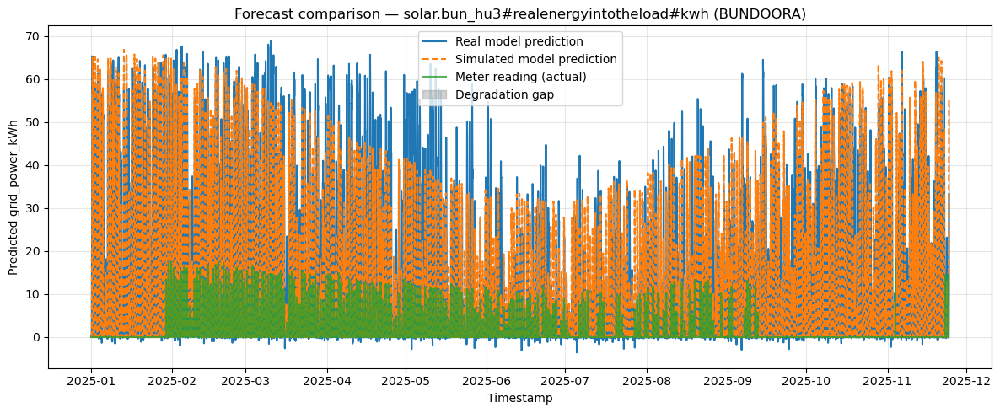

solar.bun_mc#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


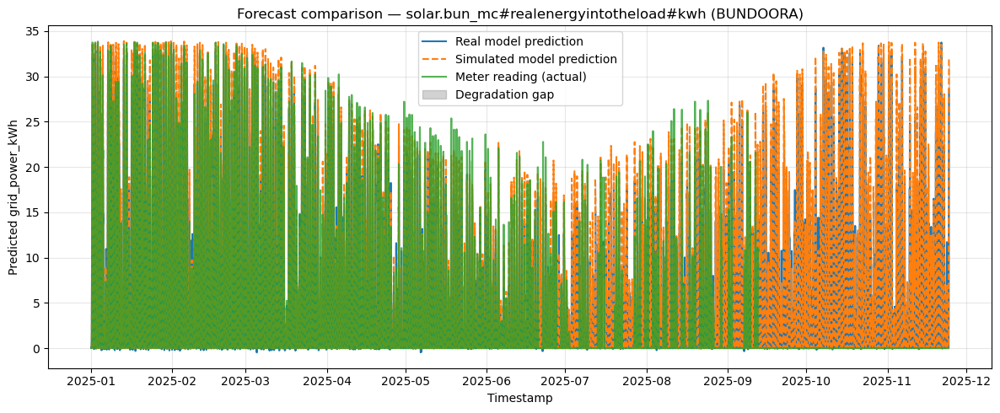

solar.bun_hs1#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


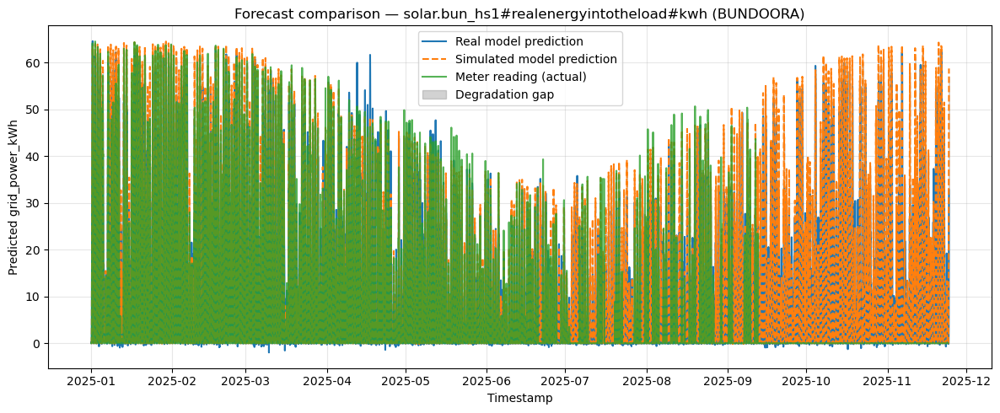

solar.bun_pw#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


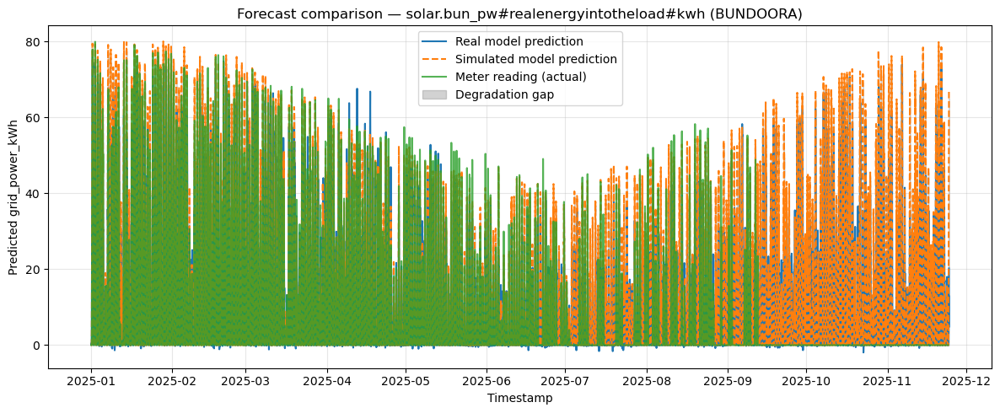

solar.bun_hv_incoming#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


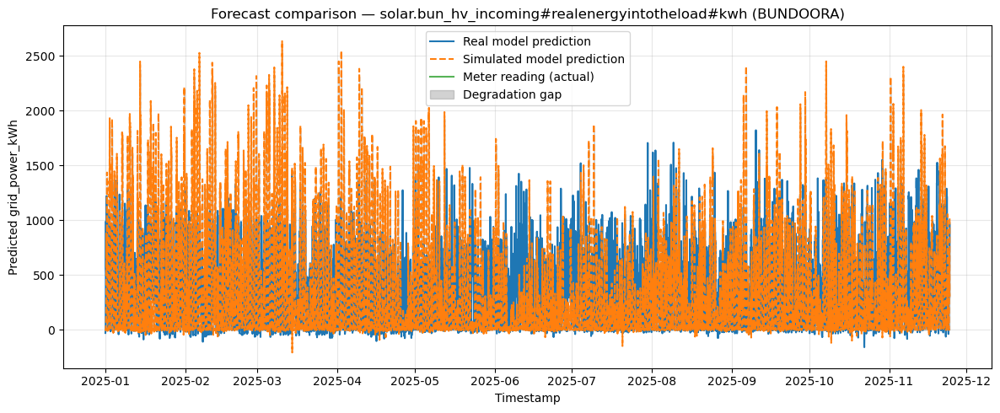

solar.bun_rlr#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


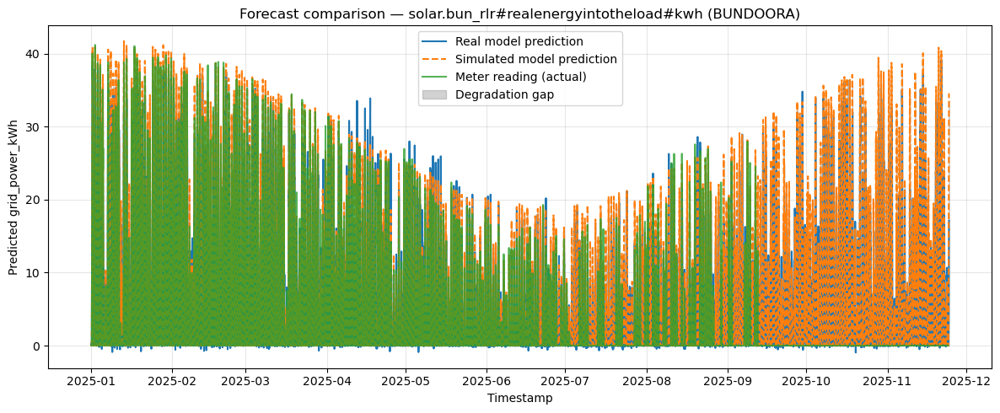

solar.bun_rd2#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


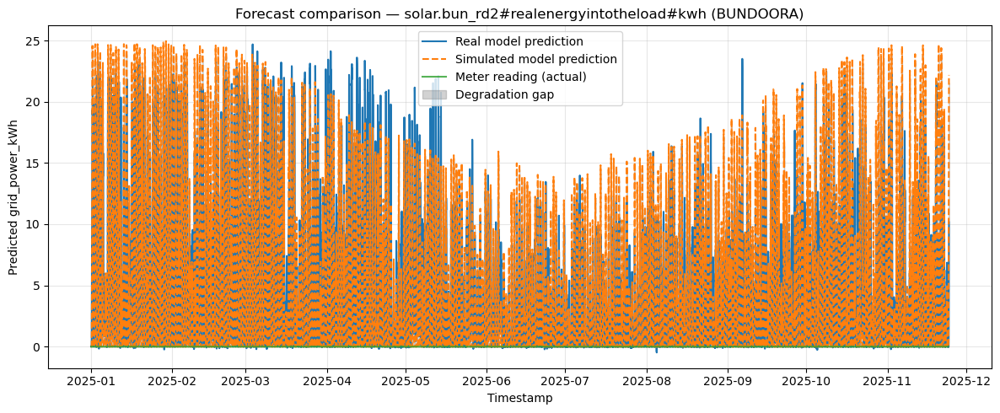

solar.bun_ps2#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


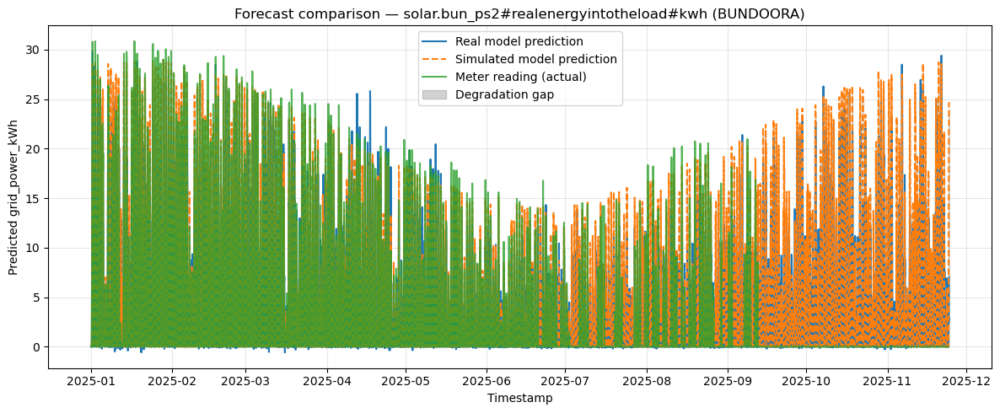

solar.bun_dmw#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


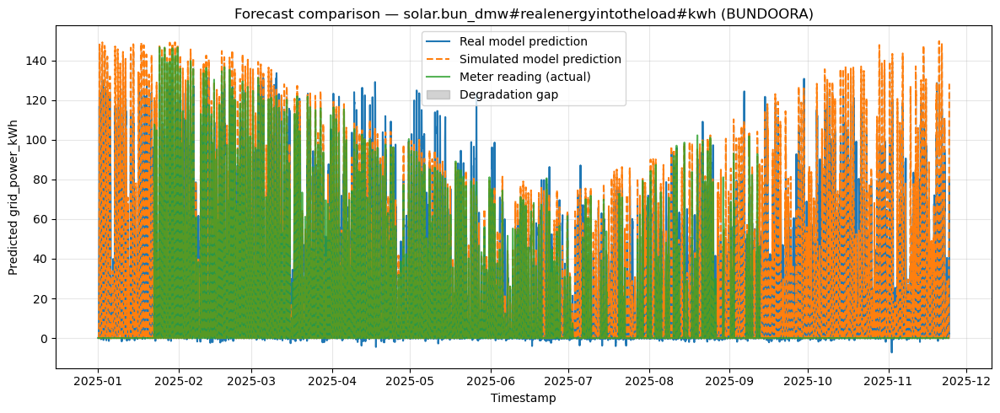

solar.bun_ltss_pv_lgcmeter#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


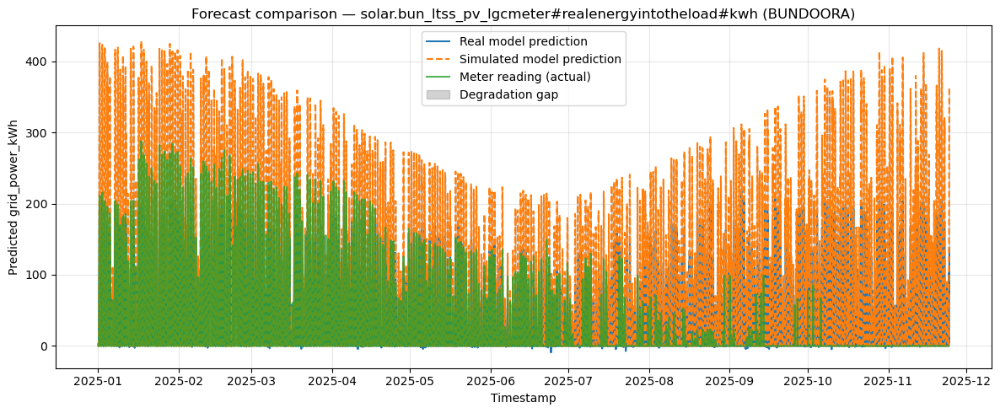

solar.bun_carm1#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


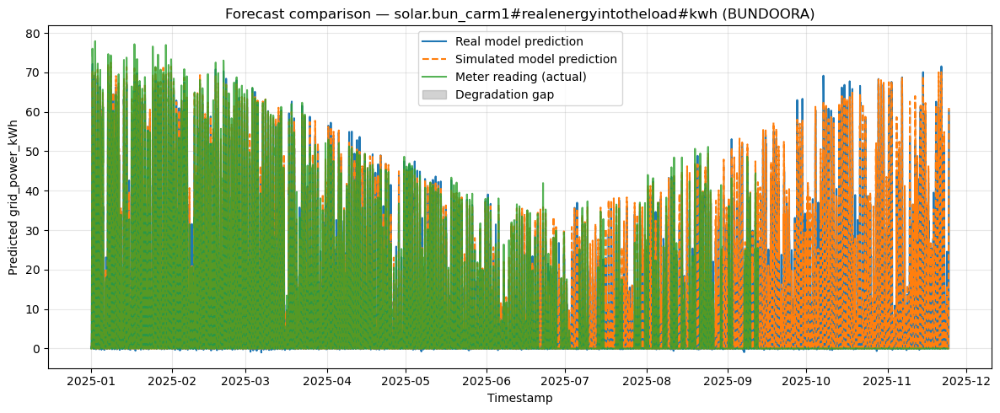

solar.bun_rd1#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


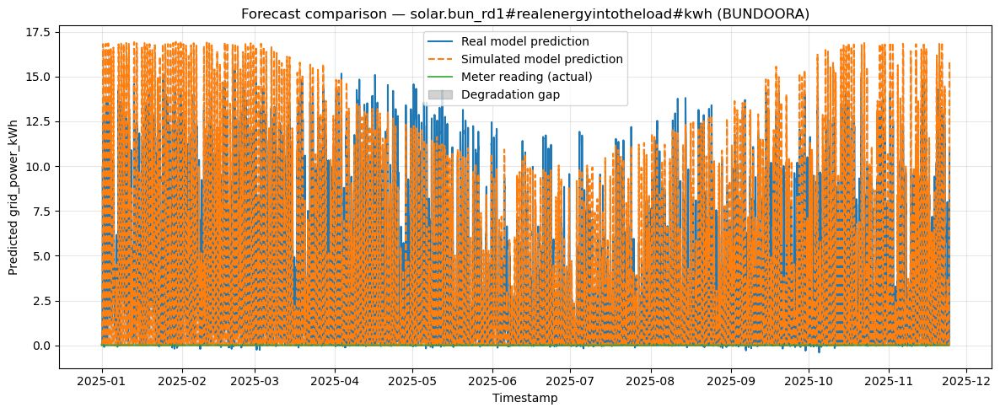

solar.bun_sw#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


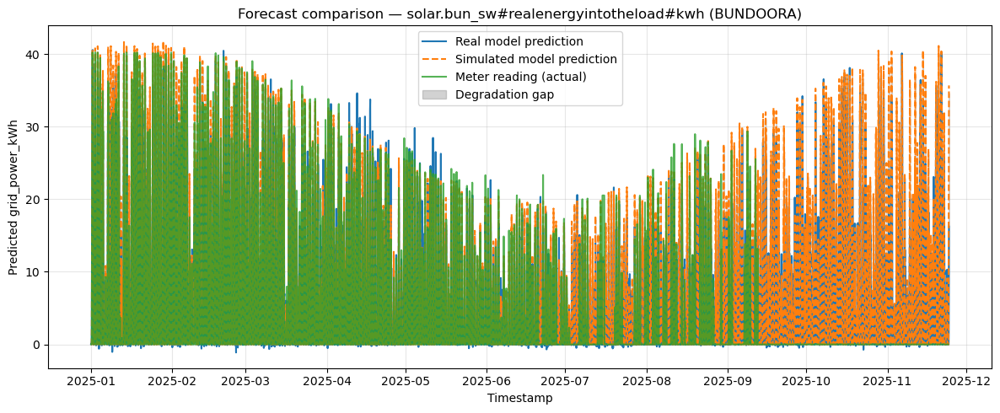

solar.bun_LTSS_PV_LGC#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


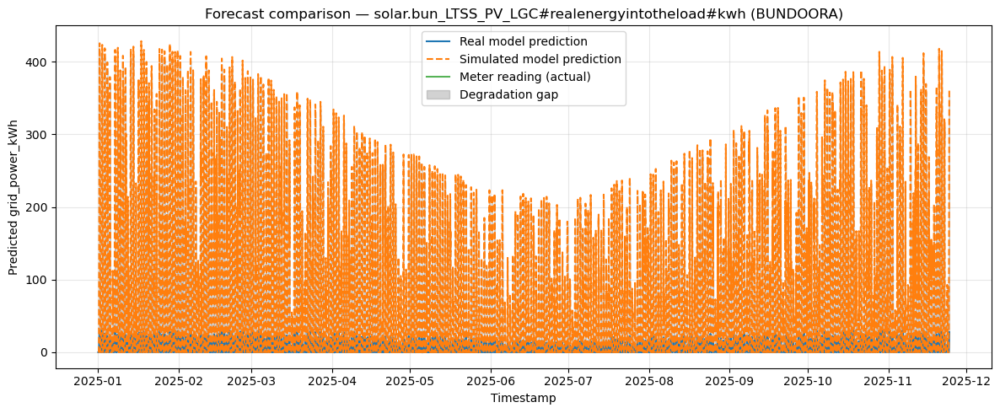

solar.bun_hs2#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


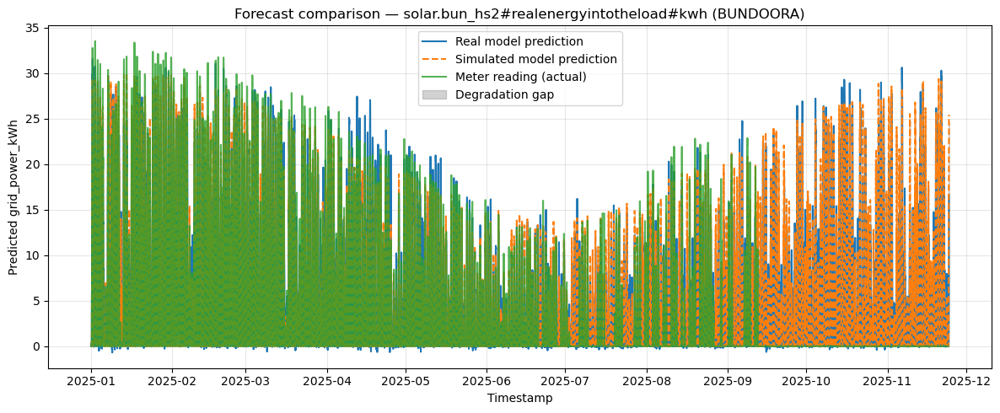

solar.bun_lims1#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


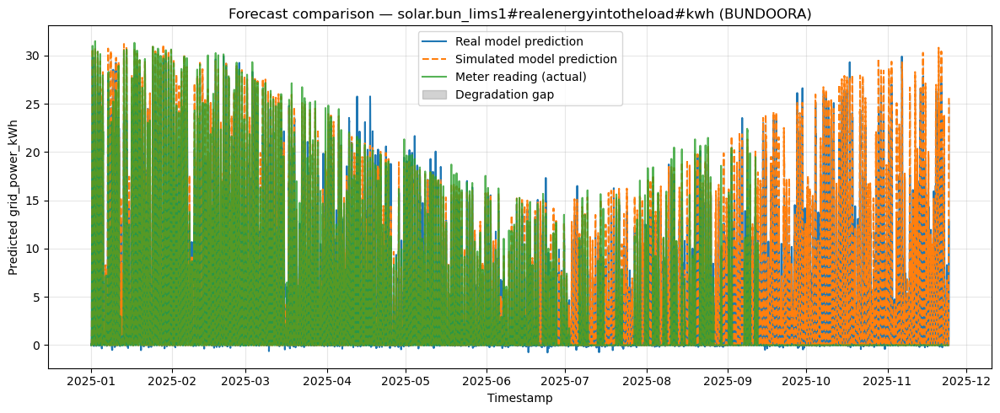

solar.bun_pe#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


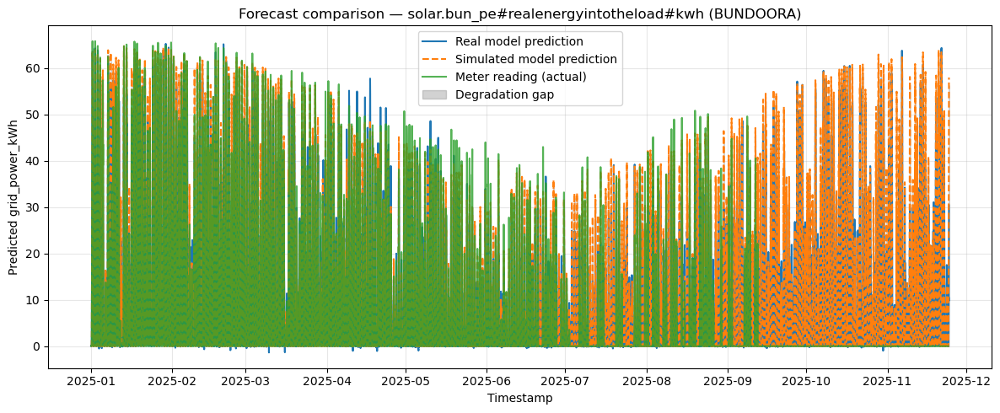

solar.bun_union#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


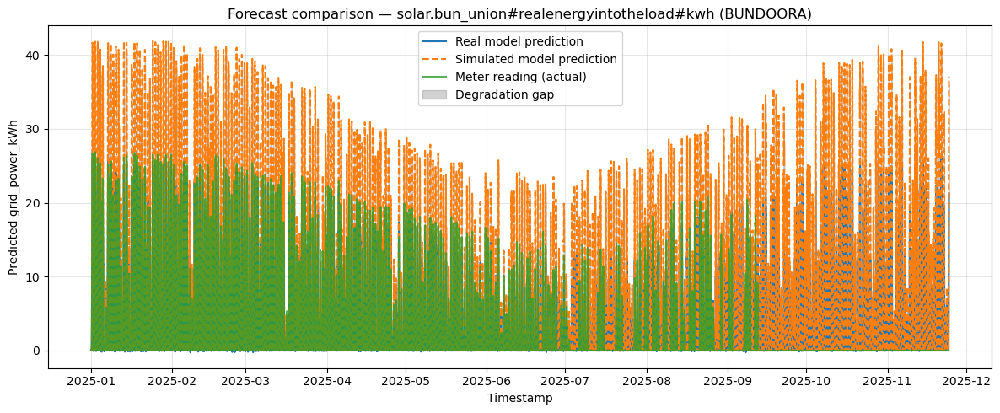

solar.bun_hsc#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


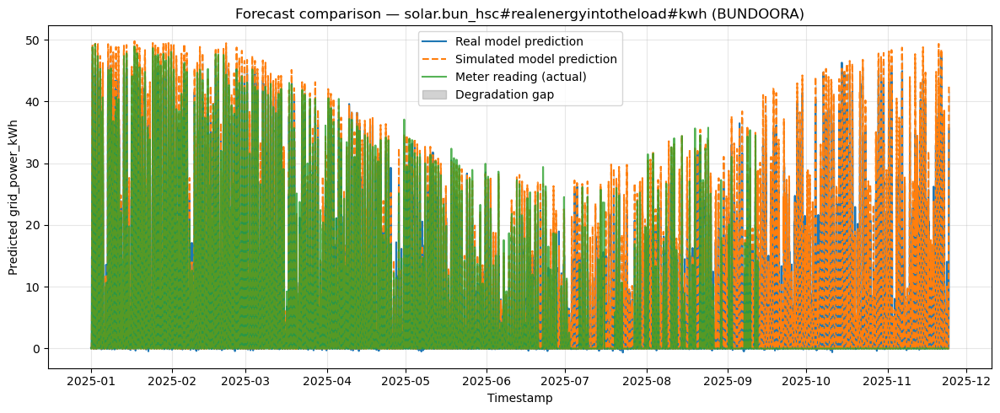

solar.shepparton#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


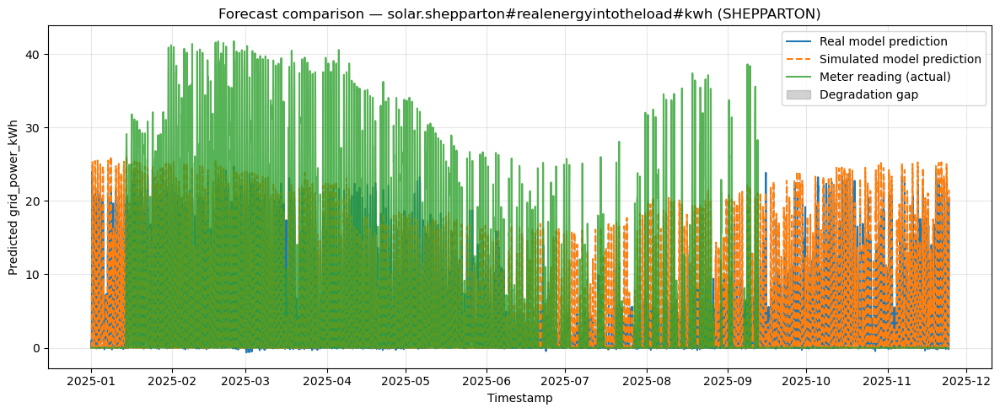

solar.bun_hs3#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


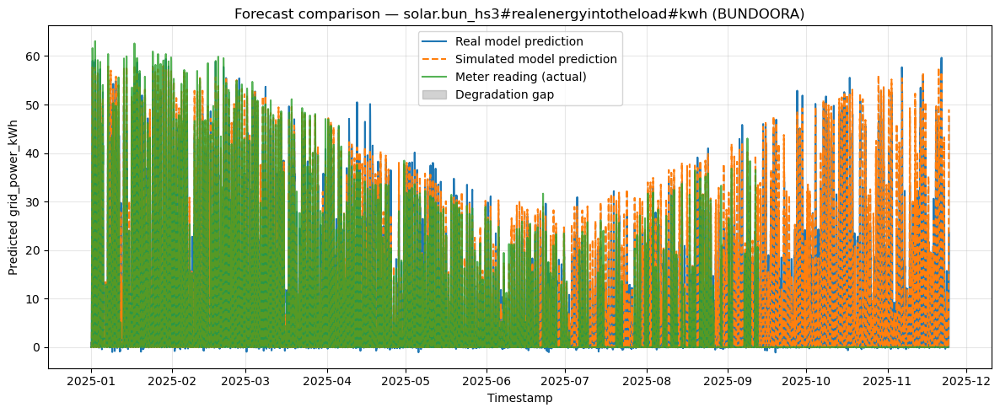

solar.bun_tlc#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


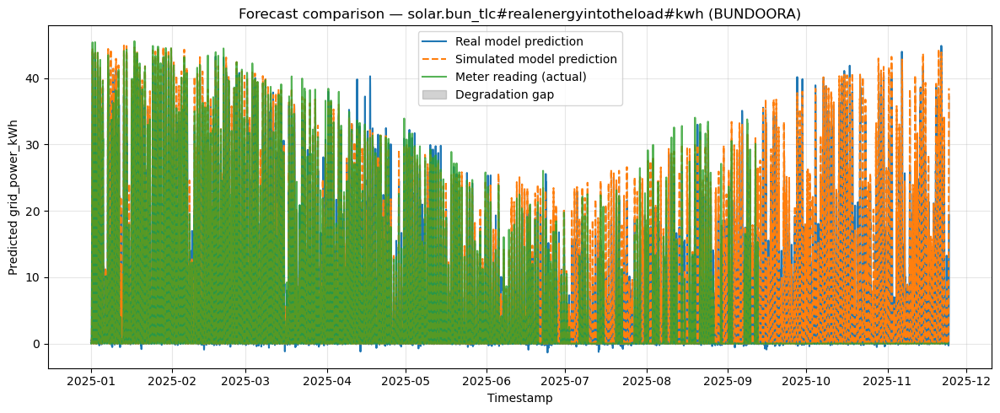

solar.bun_dw#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


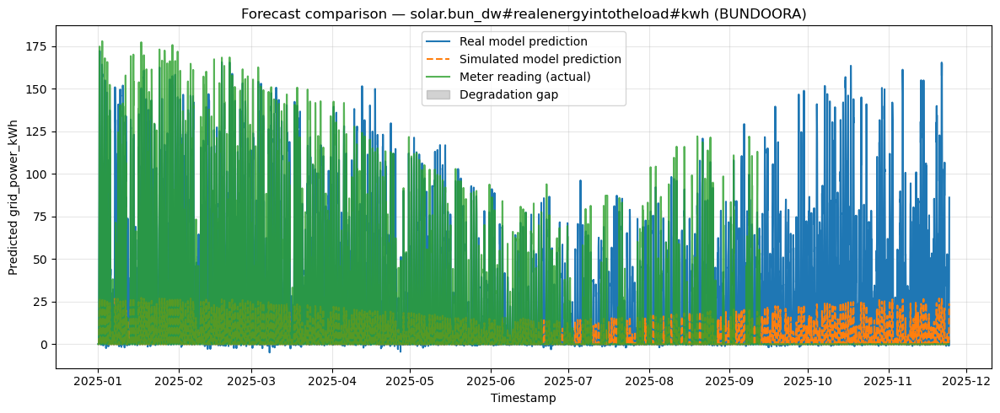

solar.bun_wlt#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


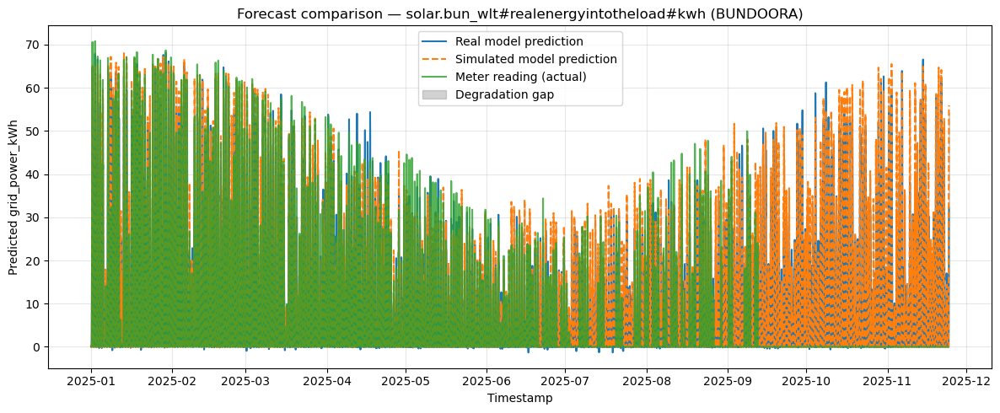

solar.mildura#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


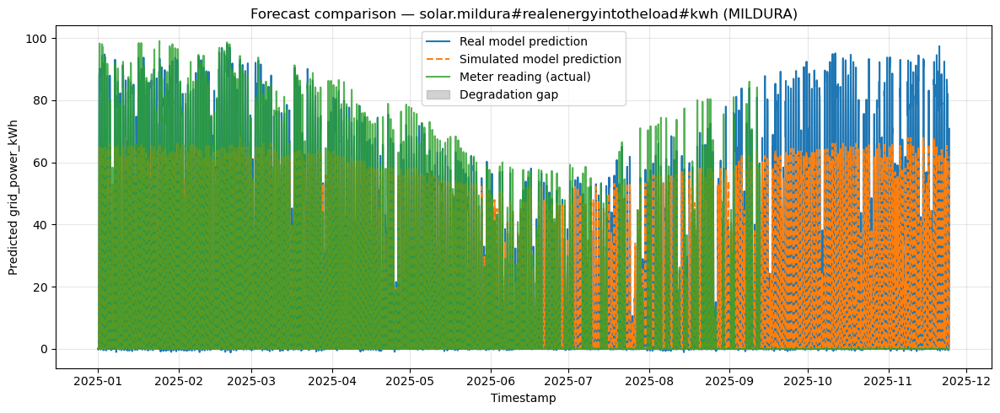

solar.bun_library#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


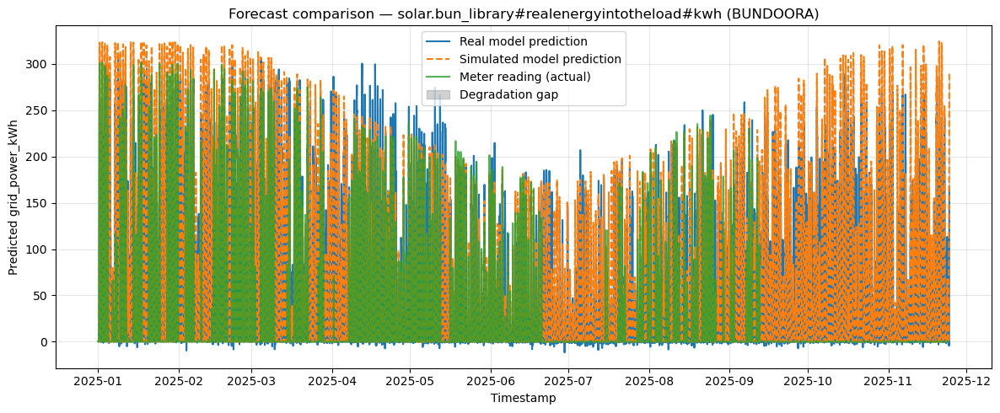

solar.bun_carm2#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


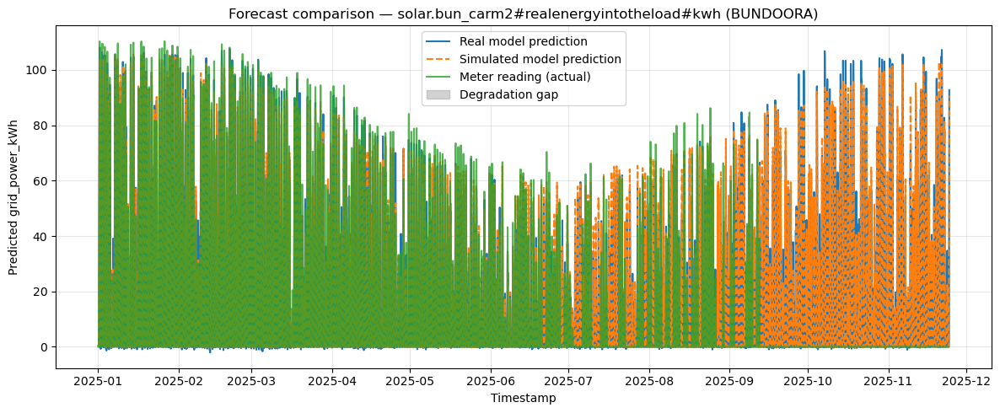

solar.bun_cs1#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


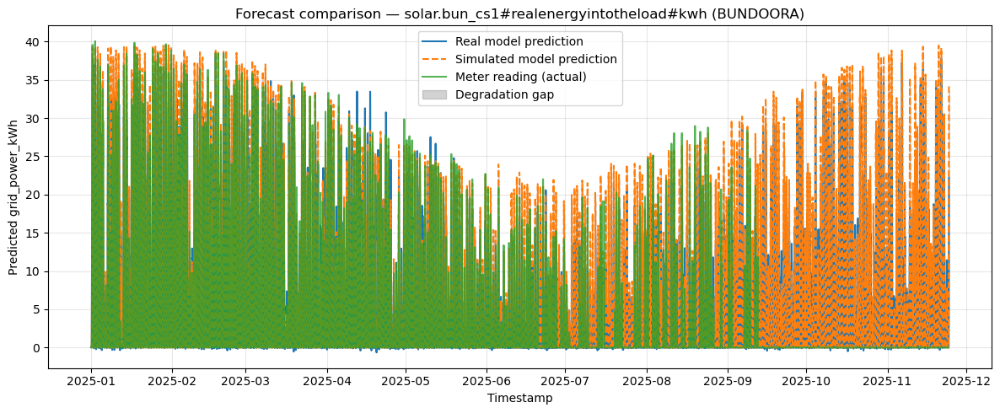

solar.bun_lwso#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


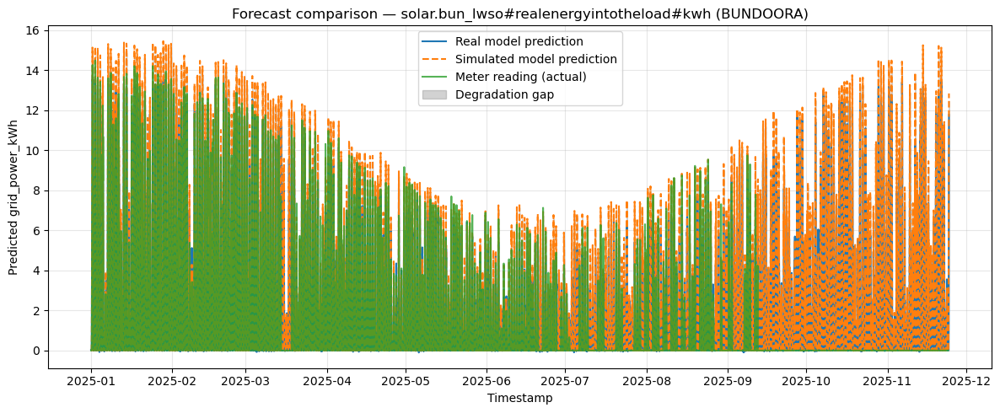

solar.bun_bg#realenergyintotheload#kwh
0.9703725093562656
Index(['timestamp', 'meter_reading', 'meter', 'campus', 'grid_power_kWh'], dtype='object')


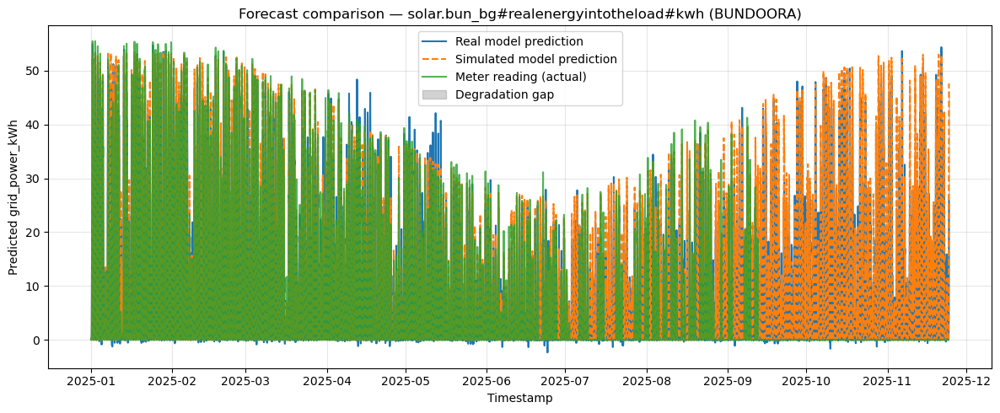

In [38]:
# common = ['solar.bun_bg#realenergyintotheload#kwh']

for meter in common:
    camp = get_campus(meter)
    if (camp in available_forecast):
        sol_df = solcast_forecast_df[solcast_forecast_df['campus'] == camp]
        features = ['global_horizontal_irradiance','air_temp','cloud_opacity','relative_humidity','dewpoint_temp','wind_speed_10m','zenith']
        target = 'grid_power_kWh'
        
        # --- minimal: normalize & dedupe forecast timestamps ---
        sol_df = sol_df.copy()
        sol_df["timestamp"] = pd.to_datetime(sol_df["timestamp"], errors="coerce")
        sol_df = sol_df.dropna(subset=["timestamp"]).sort_values("timestamp")
        sol_df = sol_df.drop_duplicates(subset=["timestamp"], keep="first")
        sol_df = sol_df[sol_df["timestamp"].dt.minute == 0]
        X = sol_df[features].astype(float)
        print(meter)
        xg_model_real = joblib.load('models/real_h/' + meter + '.pkl')
        xg_model_simulated = joblib.load('models/simulated/' + meter + '.pkl')

        y_real = xg_model_real.predict(X)
        y_sim  = xg_model_simulated.predict(X)

        # ----------------- Degradation -----------------
        DEGRADE_RATE_PER_YEAR = 0.005
        FIRST_YEAR_DROP = 0.00
        t_idx = sol_df["timestamp"]
        years_since_start = 6
        deg_factor = (1.0 - FIRST_YEAR_DROP) * np.power((1.0 - DEGRADE_RATE_PER_YEAR), years_since_start)
        y_sim_degraded = np.clip(y_sim * deg_factor, 0.0, None)
        print(deg_factor)
        print(final_df.keys())
        # ----------------- Actuals slice -----------------
        act = final_df[final_df["meter"] == meter].copy()
        act["timestamp"] = pd.to_datetime(act["timestamp"], errors="coerce")
        act = act.dropna(subset=["timestamp"]).sort_values("timestamp")
        act = act[act["timestamp"] >= sol_df["timestamp"].iloc[0]]
        # minimal: drop dup timestamps in actuals
        act = act.drop_duplicates(subset=["timestamp"], keep="first")

        # ----------------- Build Series (make indexes unique) -----------------
        def make_unique_series(values, index, keep="first"):
            s = pd.Series(values, index=index)
            if keep == "first":
                s = s[~s.index.duplicated(keep="first")]
            else:
                s = s.groupby(level=0).mean()
            return s.sort_index()

        s_act     = make_unique_series(act["grid_power_kWh"].values, act["timestamp"], keep="first")
        s_real    = make_unique_series(y_real,            sol_df["timestamp"], keep="first")
        s_sim     = make_unique_series(y_sim,             sol_df["timestamp"], keep="first")
        s_sim_deg = make_unique_series(y_sim_degraded,    sol_df["timestamp"], keep="first")
        s_ghi     = make_unique_series(sol_df["global_horizontal_irradiance"].values,
                                       sol_df["timestamp"]).astype(float)
        # ------------------ SAVE TO CSV ------------------
        all_idx = s_act.index.union(s_real.index).union(s_sim.index).union(s_sim_deg.index)

        df_out = pd.DataFrame(index=all_idx).sort_index()
        df_out.index.name = "timestamp"
        df_out.insert(0, "meter", meter)
        df_out.insert(1, "campus", camp)

        df_out["Meter_reading"]         = s_act.reindex(all_idx)
        df_out["Real_model_prediction"] = s_real.reindex(all_idx)
        df_out["Simulated_model"]       = s_sim.reindex(all_idx)
        df_out["Simulated_degraded"]    = s_sim_deg.reindex(all_idx)
        df_out["global_horizontal_irradiance"] = s_ghi.reindex(all_idx)

        csv_filename = f"{meter}_series_new.csv".replace("/", "-")
        df_out.to_csv(os.path.join("Results", csv_filename))

        # ------------------ Plot ------------------
        plt.figure(figsize=(12, 5))
        plt.plot(s_real.index, s_real.values, label="Real model prediction")
        plt.plot(s_sim.index,  s_sim.values,  label="Simulated model prediction", linestyle="--")
        plt.plot(s_act.index,  s_act.values,  label="Meter reading (actual)", linewidth=1.5, alpha=0.8)
        plt.fill_between(s_sim_deg.index, 0, s_sim_deg.values,
                         color="gray", alpha=0.35, label="Degradation gap", zorder=1)

        plt.title(f"Forecast comparison — {meter} ({camp})")
        plt.xlabel("Timestamp")
        plt.ylabel("Predicted grid_power_kWh")
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()


          timestamp  meter_reading                                     meter
2021-01-01 00:00:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 00:30:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 01:00:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 01:30:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 02:00:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 02:30:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 03:00:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 03:30:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 04:00:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 04:30:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 05:00:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh
2021-01-01 05:30:00       0.000000 solar.bun_carm1#realenergyintotheload#kwh

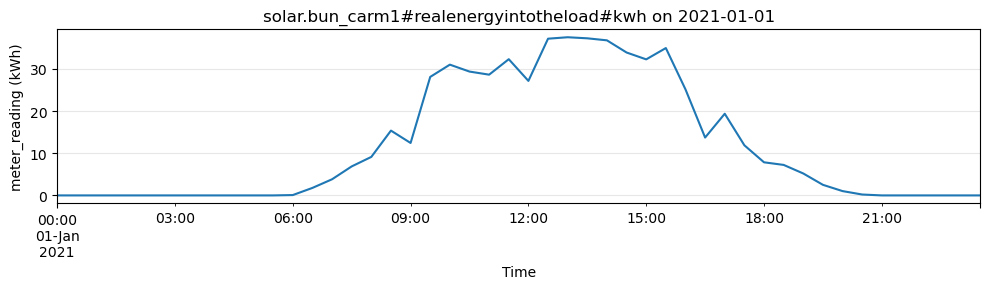

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Load CSV ---
# Change the path if needed
df = pd.read_csv("data\SolarMeterReadings30min.csv", parse_dates=["timestamp"])

# --- Params ---
meter_key = "solar.bun_carm1#realenergyintotheload#kwh"     # case-insensitive partial match
day_str   = "2021-01-01"        # the day you want

# --- Filter to this meter ---
m_mask = df["meter"].str.lower().str.contains(meter_key.lower(), regex=False)

# --- Filter to that single day (00:00 to <00:00 next day) ---
d0 = pd.to_datetime(day_str)
d1 = d0 + pd.Timedelta(days=1)
day_df = (
    df.loc[m_mask & (df["timestamp"] >= d0) & (df["timestamp"] < d1),
           ["timestamp", "meter_reading", "meter"]]
    .sort_values("timestamp")
)

# --- See the data ---
print(day_df.to_string(index=False))

# --- Optional: quick plot ---
if not day_df.empty:
    ax = day_df.set_index("timestamp")["meter_reading"].plot(figsize=(10, 3))
    ax.set_title(f"{meter_key} on {d0.date()}")
    ax.set_xlabel("Time")
    ax.set_ylabel("meter_reading (kWh)")
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    # Helpful hint if nothing found
    avail = df.loc[m_mask, "timestamp"]
    if not avail.empty:
        print(f"No records on {d0.date()}. Available range for this meter: "
              f"{avail.min().date()} to {avail.max().date()}")
    else:
        print("No rows matching this meter id.")


In [ ]:
day_df

,timestamp,meter_reading,meter
1517617,2021-01-01 00:00:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517618,2021-01-01 00:30:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517619,2021-01-01 01:00:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517620,2021-01-01 01:30:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517621,2021-01-01 02:00:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517622,2021-01-01 02:30:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517623,2021-01-01 03:00:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517624,2021-01-01 03:30:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517625,2021-01-01 04:00:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh
1517626,2021-01-01 04:30:00,0.000000,solar.bun_carm1#realenergyintotheload#kwh


## Predict using XGBoost

In [ ]:
# Create an SQLAlchemy engine
engine = create_engine(connection_url)
all_temp_dfs = []

first = True
for i in range(len(meters)):
    meter = meters[i]
    camp = get_campus(meter)

    temp_df = df[df['meter'] == meter]
    if temp_df.empty:
        print("dataset is empty")
    else:
        temp_df.set_index('timestamp', inplace=True)
        temp_df = temp_df.resample('H').agg({
        'meter_reading': 'sum',  # Summing up for 'value_sum'
        })
        temp_df.reset_index(inplace=True)

        sol_df = solcast_df[solcast_df['campus'] == camp]
        temp_df = pd.merge(temp_df, sol_df, on='timestamp', how='inner')
        # print(temp_df)
        # print(temp_df)
        # break
        temp_df.set_index('timestamp', inplace=True)
        temp_df = temp_df.resample('H').agg({
        'meter_reading': 'sum',  # Summing up for 'value_sum'
        'global_horizontal_irradiance': 'mean',  # Summing up for 'value_sum'
        'air_temp': 'mean',
        'cloud_opacity': 'mean',
        'relative_humidity': 'mean',
        'dewpoint_temp': 'mean',
        'wind_speed_10m': 'mean',
        'zenith': 'mean'
        })

        temp_df.reset_index(inplace=True)

        print(f"Processing {meter}")

        # try:
        model_name = meter + '.pkl'
        filepath = os.path.join('models/simulated', model_name)
        xgb_model = joblib.load(filepath)

        features = ['global_horizontal_irradiance','air_temp','cloud_opacity','relative_humidity','dewpoint_temp','wind_speed_10m','zenith']
        target = 'meter_reading'

        # Prepare the data
        X = temp_df[features].astype(float)
        y = temp_df[target].astype(float)

        xgb_predictions = xgb_model.predict(X)   # ---------------------------

        # Evaluate the models___
        xgb_rmse = np.sqrt(mean_squared_error(y, xgb_predictions))

        print(f'Test RMSE: {xgb_rmse}')

        temp_df['baseline'] = xgb_predictions       # prediceted Value

        # temp df contains data of hourly. Following step accumulate that data for daily and filter sum amount of data.



        temp_df_cp = temp_df.copy()

        temp_df.set_index('timestamp', inplace=True)
        temp_df = temp_df.resample('D').agg({
        'meter_reading': 'sum',  # Summing up for 'value_sum'
        'global_horizontal_irradiance': 'mean',
        'baseline': 'sum',  # Summing up for 'value_sum'
        })
        temp_df.reset_index(inplace=True)
        temp_df = temp_df.round(4)
        temp_df['meter'] = [meter] * len(temp_df)

        temp_df_cp['meter'] = [meter] * len(temp_df_cp)
        temp_df_cp.reset_index(inplace=True)
        all_temp_dfs.append(temp_df_cp.copy())

        if(first):
            res_df = temp_df.copy()
            first = False
        else:
            res_df = pd.concat([res_df, temp_df], ignore_index=True)
        # except:
        #     print("Failed")
        acc_df.loc[acc_df['Meter']==meter, 'TEST NEW RMSE'] = xgb_rmse
        print("")
# acc_df.to_csv('data/model_accuracy.csv', index=False)
all_meters_dfs = pd.concat(all_temp_dfs, ignore_index=True)
all_meters_dfs.to_csv('data/baseline_hourly_new.csv', index=False)
# Close the engine connection
engine.dispose()

dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
Processing solar.bun_dmw#realenergyintotheload#kwh
Test RMSE: 47.79589345937992

dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty
dataset is empty


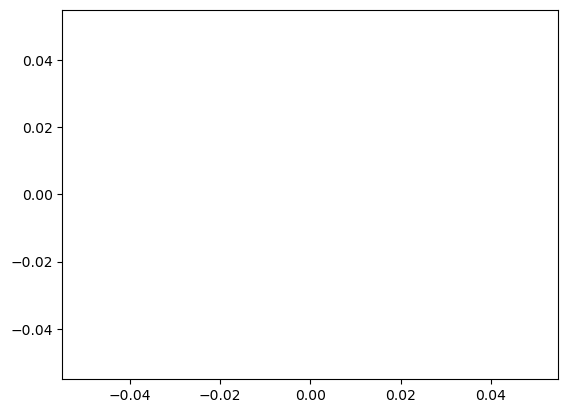

In [ ]:
temp = res_df[res_df['meter'] == 'solar.bun_library#realenergyintotheload#kwh']
plt.plot(temp['baseline'].to_list())
plt.plot(temp['meter_reading'].to_list())

In [ ]:
 pd.DataFrame({'Timestamp': res_df['timestamp'].to_list(),
              'Actual (kWh)': res_df['meter_reading'].to_list(),
              'Baseline (kWh)': res_df['baseline'].to_list(),
              'GHI Solcast (W/m^2)': res_df['global_horizontal_irradiance'].to_list(),
              'Meter': res_df['meter'].to_list()
             }).to_csv('data/baseline_daily_new.csv', index=False)

In [ ]:
------------------------------------------------------------------------------------------------------------------------------------

SyntaxError: invalid syntax (4183810212.py, line 1)

In [ ]:
df1 = pd.read_csv('data/baseline_daily_new.csv')
df1['Timestamp'] = pd.to_datetime(df1['Timestamp'])

df2 = pd.read_csv('data/baseline_daily_sim.csv')
df2['Timestamp'] = pd.to_datetime(df2['Timestamp'])

for m in meters:
    temp_df1 = df1[df1['Meter'] == m]
    temp_df2 = df2[df2['Meter'] == m]

    
    df1 = df1[df1['Timestamp'] >= '2024-01-01']


FileNotFoundError: [Errno 2] No such file or directory: 'data/baseline_daily_sim.csv'

In [ ]:
df1 = pd.read_csv('data/baseline_daily_new.csv')
df1['Timestamp'] = pd.to_datetime(df1['Timestamp'])
latest_indices = df1.groupby('Meter')['Timestamp'].idxmax()
df1.drop(latest_indices, inplace=True)

df2 = pd.read_csv('dta/baseline_daily_sim.csv')
df2['Timestamp'] = pd.to_datetime(df2['Timestamp'])
df2 = df2[df2['Timestamp'] >= '2024-08-20']

df_combined = pd.concat([df1, df2], ignore_index=True)
df_combined.to_csv('dta/baseline_with_sim.csv')

In [ ]:
df_combined

In [ ]:
df1['Timestamp'] = pd.to_datetime(df1['Timestamp'])

# Get the index of the latest timestamp for each 'Meter'
latest_indices = df1.groupby('Meter')['Timestamp'].idxmax()

# Select rows based on those indices

df1.drop(latest_indices, inplace=True)
latest_indices = df1.groupby('Meter')['Timestamp'].idxmax()
df1.loc[latest_indices]

,Timestamp,Actual (kWh),Baseline (kWh),GHI Solcast (W/m^2),Meter
47255,2024-08-19,219.2656,215.533096,156.2500,solar.bun_bg#realenergyintotheload#kwh
13501,2024-08-19,274.4844,284.169312,156.2500,solar.bun_carm1#realenergyintotheload#kwh
23630,2024-08-19,472.4062,432.402710,156.2500,solar.bun_carm2#realenergyintotheload#kwh
38820,2024-08-19,139.5000,158.753006,156.2500,solar.bun_cs1#realenergyintotheload#kwh
5066,2024-08-19,576.9062,572.958008,156.2500,solar.bun_dmw#realenergyintotheload#kwh
43881,2024-08-19,655.1250,111.081902,156.2500,solar.bun_dw#realenergyintotheload#kwh
8440,2024-08-19,255.4531,261.404205,156.2500,solar.bun_hs1#realenergyintotheload#kwh
10127,2024-08-19,115.6406,107.993103,156.2500,solar.bun_hs2#realenergyintotheload#kwh
21943,2024-08-19,205.1719,221.702393,156.2500,solar.bun_hs3#realenergyintotheload#kwh
37133,2024-08-19,175.1562,195.907898,156.2500,solar.bun_hsc#realenergyintotheload#kwh


In [ ]:
df2[df2['Timestamp'] >= '2024-08-20']

,Timestamp,Actual (kWh),Baseline (kWh),GHI Solcast (W/m^2),Meter
232,2024-08-20,0,123.901398,121.6125,solar.bun_sw#realenergyintotheload#kwh
233,2024-08-21,0,57.588902,58.6854,solar.bun_sw#realenergyintotheload#kwh
234,2024-08-22,0,185.888596,181.4584,solar.bun_sw#realenergyintotheload#kwh
235,2024-08-23,0,172.726807,169.4452,solar.bun_sw#realenergyintotheload#kwh
236,2024-08-24,0,183.767593,179.9368,solar.bun_sw#realenergyintotheload#kwh
...,...,...,...,...,...
10975,2024-12-27,0,319.914612,234.4042,solar.bun_bg#realenergyintotheload#kwh
10976,2024-12-28,0,91.397301,70.2292,solar.bun_bg#realenergyintotheload#kwh
10977,2024-12-29,0,404.654602,298.5944,solar.bun_bg#realenergyintotheload#kwh
10978,2024-12-30,0,391.507690,289.6764,solar.bun_bg#realenergyintotheload#kwh


In [ ]:
df_combined

,Timestamp,Actual (kWh),Baseline (kWh),GHI Solcast (W/m^2),Meter
0,2020-01-08,0.0,295.554413,443.4375,solar.bun_sw#realenergyintotheload#kwh
1,2020-01-09,0.0,341.279694,346.7917,solar.bun_sw#realenergyintotheload#kwh
2,2020-01-10,0.0,144.357697,142.1250,solar.bun_sw#realenergyintotheload#kwh
3,2020-01-11,0.0,191.430099,190.0000,solar.bun_sw#realenergyintotheload#kwh
4,2020-01-12,0.0,288.009796,285.0833,solar.bun_sw#realenergyintotheload#kwh
...,...,...,...,...,...
58232,2024-12-27,NaN,NaN,NaN,NaN
58233,2024-12-28,NaN,NaN,NaN,NaN
58234,2024-12-29,NaN,NaN,NaN,NaN
58235,2024-12-30,NaN,NaN,NaN,NaN


In [ ]:
# Solar Baseline for year ahead

In [ ]:
# Create an SQLAlchemy engine
engine = create_engine(connection_url)
    
first = True
for meter in meters:
    print(f"Processing {meter}")
    
    try:
        # Use the engine to execute a query and load the result set into a DataFrame
        query = f"SELECT *, [grid_power] / 1000 AS grid_power_kWh FROM [Leap].[dbo].[SolarSiteSimulation] WHERE meter = '{meter}' ORDER BY timestamp"
        sim_df = pd.read_sql_query(query, engine)

        sim_df = sim_df[:len(sim_df)//2]
        sim_df['timestamp'] = sim_df['timestamp'].apply(lambda x: x.replace(year=2024))
        print(sim_df.head(10))
        model_name = meter + '.pkl'
        filepath = os.path.join('models/new', model_name)
        xgb_model = joblib.load(filepath)

        # Select features and target variable
        features = ['global_horizontal_irradiance']
        target = 'grid_power_kWh'

        # Prepare the data
        X = sim_df[features].astype(float)
        y = sim_df[target].astype(float)

        xgb_predictions = xgb_model.predict(X)

        # Evaluate the models___
        xgb_rmse = np.sqrt(mean_squared_error(y, xgb_predictions))

        print(f'Test RMSE: {xgb_rmse}')

        sim_df['baseline'] = xgb_predictions

        sim_df.set_index('timestamp', inplace=True)
        sim_df = sim_df.resample('D').agg({
        'global_horizontal_irradiance': 'mean',
        'baseline': 'sum',  # Summing up for 'value_sum'
        })
        sim_df.reset_index(inplace=True)

        sim_df = sim_df.round(4)
        sim_df['meter'] = [meter] * len(sim_df)
        sim_df['meter_reading'] = [0] * len(sim_df)

        if(first):
            res_df = sim_df.copy()
            first = False
        else:
            res_df = pd.concat([res_df, sim_df], ignore_index=True)
    except:
        print("Failed")
        
    print("")
# Close the engine connection
engine.dispose()

Processing solar.bun_sw#realenergyintotheload#kwh
Test RMSE: 0.5454388624151609

Processing solar.bun_ltss_pv_lgcmeter#realenergyintotheload#kwh
Test RMSE: 4.212827035899406

Processing solar.bun_dmw#realenergyintotheload#kwh
Test RMSE: 2.930582740105505

Processing solar.bun_wlt#realenergyintotheload#kwh
Test RMSE: 3.2888890829773985

Processing solar.bun_hs1#realenergyintotheload#kwh
Test RMSE: 1.2175213649216885

Processing solar.bun_hs2#realenergyintotheload#kwh
Test RMSE: 0.579245192647545

Processing solar.bun_lims1#realenergyintotheload#kwh
Test RMSE: 0.3639964058359938

Processing solar.bun_carm1#realenergyintotheload#kwh
Test RMSE: 0.773044531688831

Processing solar.bun_mb#realenergyintotheload#kwh
Test RMSE: 1.7303280653180928

Processing solar.shepparton#realenergyintotheload#kwh
Test RMSE: 1.374830421151646

Processing solar.bun_ss#realenergyintotheload#kwh
Test RMSE: 1.5107742220318894

Processing solar.bun_union#realenergyintotheload#kwh
Test RMSE: 0.9910393334689752

Pr

In [ ]:
pd.DataFrame({'Timestamp': res_df['timestamp'].to_list(), 
              'Actual (kWh)': res_df['meter_reading'].to_list(),
              'Baseline (kWh)': res_df['baseline'].to_list(),
              'GHI Solcast (W/m^2)': res_df['global_horizontal_irradiance'].to_list(),
              'Meter': res_df['meter'].to_list()
             }).to_csv('data/baseline_daily_sim.csv', index=False)

## _____________________________________________________________________________________  MY DEV  _____________________________________________________________________________

In [ ]:
df_30 = pd.read_csv("data/SolarMeterReadings30min.csv")
sol_real = pd.read_csv("data/solcast_real.csv")
sol_pred = pd.read_csv("data/solcast_pred.csv")
sol_pred = sol_pred[sol_pred["timestamp"] > list(df_30["timestamp"])[-1]]
meters = pd.unique(df_30["meter"])


In [ ]:


for meter in meters:

    

['solar.albury-wodonga_admin#realenergyintotheload#kwh'
 'solar.albury-wodonga_carport#realenergyintotheload#kwh'
 'solar.albury-wodonga_health#realenergyintotheload#kwh'
 'solar.albury-wodonga_library#realenergyintotheload#kwh'
 'solar.albury-wodonga_mh1#realenergyintotheload#kwh'
 'solar.albury-wodonga_mh2#realenergyintotheload#kwh'
 'solar.bendigo_as2_carpark#realenergyintotheload#kwh'
 'solar.bendigo_as2_hhs1-2#realenergyintotheload#kwh'
 'solar.bendigo_as2_ssc_roof#realenergyintotheload#kwh'
 'solar.bendigo_hillside_a1#realenergyintotheload#kwh'
 'solar.bendigo_hillside_a2#realenergyintotheload#kwh'
 'solar.bendigo_hillside_a3#realenergyintotheload#kwh'
 'solar.bendigo_hillside_a4-6#realenergyintotheload#kwh'
 'solar.bendigo_lsu_carpark#realenergyintotheload#kwh'
 'solar.bendigo_lsu_ed_roof#realenergyintotheload#kwh'
 'solar.bendigo_lu_business#realenergyintotheload#kwh'
 'solar.bendigo_lu_visual_arts#realenergyintotheload#kwh'
 'solar.bun_bg#realenergyintotheload#kwh'
 'solar.bun

In [ ]:
sol_pred

,Unnamed: 0,air_temp,albedo,azimuth,cloud_opacity,dewpoint_temp,dhi,dni,ghi,precipitable_water,...,snow_water_equivalent,snow_soiling_rooftop,snow_soiling_ground,wind_direction_100m,wind_direction_10m,wind_speed_100m,wind_speed_10m,zenith,timestamp,campus
328,336,8,0.17,-36,0,1.4,51,930,551,5.7,...,0.0,0,0,128,124,1.9,1.6,58,2025-08-18 10:30:00,WODONGA
329,0,9,0.14,-37,56,2.4,218,0,218,8.7,...,0.0,0,0,165,165,2.5,1.4,60,2025-08-18 10:30:00,BUNDOORA
330,337,10,0.17,-28,0,0.8,53,946,605,5.8,...,0.0,0,0,134,133,1.8,1.5,54,2025-08-18 11:00:00,WODONGA
331,1,10,0.14,-29,56,1.9,243,0,243,8.6,...,0.0,0,0,166,165,3.5,2.0,56,2025-08-18 11:00:00,BUNDOORA
332,2,11,0.14,-21,55,1.4,268,0,268,8.5,...,0.0,0,0,168,169,4.2,2.4,54,2025-08-18 11:30:00,BUNDOORA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1307,333,11,0.14,43,40,7.1,227,136,298,15.8,...,0.0,0,0,267,267,7.8,4.1,59,2025-08-28 15:00:00,BUNDOORA
1308,670,9,0.17,52,44,7.6,201,80,237,17.7,...,0.0,0,0,284,289,3.6,1.7,63,2025-08-28 15:30:00,WODONGA
1309,334,11,0.14,49,41,7.1,197,121,252,15.4,...,0.0,0,0,268,269,7.5,3.9,63,2025-08-28 15:30:00,BUNDOORA
1310,335,10,0.14,56,43,7.1,164,91,199,14.9,...,0.0,0,0,269,271,7.2,3.6,68,2025-08-28 16:00:00,BUNDOORA
